# Índices y Tipología de la Complejidad Electoral 2020: Municipios
### INFOTEC-Maestría en Ciencia de Datos e Información
#### Autor: Miguel David Alvarez Hernández (mdalvarezh@gmail.com)

<br>

## <center>Análisis exploratorio, Componentes Principales y Agrupamiento<center>

In [1]:
import datetime
now = datetime.datetime.now()
print ("Última versión:")
print (now.strftime("%Y-%m-%d %H:%M:%S"))

Última versión:
2020-06-26 13:02:10


## Setup

In [2]:
import pandas as pd  
import numpy as np
import pandas_profiling
from itertools import combinations 
from dateutil.parser import parse 
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.express as px

## Importación de datos procesados

In [3]:
#datos procesados
datos = pd.read_csv("Datos-procesados_mun2019.csv", encoding='utf-8')

In [4]:
print(datos.dtypes)
datos

EDO                   int64
NOMBRE_ESTADO        object
MUN                   int64
NOMBRE_MUNICIPIO     object
Coef_Var_PE         float64
Coef_Var_LNE        float64
Var_Prop_PE         float64
Var_Prop_LNE        float64
Autocorr_PE         float64
Autocorr_LNE        float64
Razon_LNE_PE        float64
PE                  float64
LNE                 float64
TC_LNE_2019         float64
NUM_SECC_RUR          int64
Area_Km2            float64
Densidad_LNE        float64
dtype: object


,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,Coef_Var_PE,Coef_Var_LNE,Var_Prop_PE,Var_Prop_LNE,Autocorr_PE,Autocorr_LNE,Razon_LNE_PE,PE,LNE,TC_LNE_2019,NUM_SECC_RUR,Area_Km2,Densidad_LNE
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,0.017131,0.015085,0.020041,0.017733,0.965775,0.755939,0.989272,35518.0,34917.0,0.037498,3,9.791576,3566.024547
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,0.005040,0.008345,0.005584,0.008887,0.435676,0.237061,0.991803,7004.0,6914.0,0.000289,4,3.241104,2133.223463
2,1,AGUASCALIENTES,9,TEPEZALA,0.006879,0.011777,0.007903,0.011921,0.605737,0.344567,0.990635,15733.0,15545.0,0.005108,6,6.271495,2478.675412
3,1,AGUASCALIENTES,11,EL LLANO,0.008917,0.012239,0.009983,0.014232,0.585621,0.504020,0.991016,15298.0,15067.0,-0.003373,6,10.006312,1505.749552
4,1,AGUASCALIENTES,2,ASIENTOS,0.008083,0.013432,0.009252,0.015397,0.581193,0.374738,0.989080,34722.0,34222.0,0.001874,11,23.049424,1484.722551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.014994,0.019408,0.017748,0.021905,0.987834,0.959378,0.983523,7061.0,6959.0,0.066677,13,13.507234,515.205401
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.019415,0.022769,0.022931,0.026072,0.964977,0.984897,0.986450,17610.0,17372.0,0.082705,32,17.129462,1014.159112
2453,32,ZACATECAS,44,TABASCO,0.027363,0.029823,0.032716,0.035416,0.992677,0.993335,0.983221,12689.0,12527.0,0.100307,16,8.620183,1453.217492
2454,32,ZACATECAS,9,CHALCHIHUITES,0.016451,0.021097,0.019649,0.024771,0.975279,0.988608,0.982861,8339.0,8222.0,0.075052,10,13.707054,599.837116


<br>

# Análisis exploratorio de los indicadores base

In [5]:
#se reordena y eliminan del dataframe las variables que no se usarán
datos_mun = datos.drop(columns=['Coef_Var_PE', 'Var_Prop_PE', 'Autocorr_PE','Area_Km2'])
datos_mun = datos_mun.reindex(columns= ['EDO','NOMBRE_ESTADO','MUN','NOMBRE_MUNICIPIO','NUM_SECC_RUR','LNE','Densidad_LNE','Razon_LNE_PE','TC_LNE_2019','Coef_Var_LNE','Var_Prop_LNE','Autocorr_LNE'])
datos_mun

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,2133.223463,0.991803,0.000289,0.008345,0.008887,0.237061
2,1,AGUASCALIENTES,9,TEPEZALA,6,15545.0,2478.675412,0.990635,0.005108,0.011777,0.011921,0.344567
3,1,AGUASCALIENTES,11,EL LLANO,6,15067.0,1505.749552,0.991016,-0.003373,0.012239,0.014232,0.504020
4,1,AGUASCALIENTES,2,ASIENTOS,11,34222.0,1484.722551,0.989080,0.001874,0.013432,0.015397,0.374738
...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,13,6959.0,515.205401,0.983523,0.066677,0.019408,0.021905,0.959378
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,32,17372.0,1014.159112,0.986450,0.082705,0.022769,0.026072,0.984897
2453,32,ZACATECAS,44,TABASCO,16,12527.0,1453.217492,0.983221,0.100307,0.029823,0.035416,0.993335
2454,32,ZACATECAS,9,CHALCHIHUITES,10,8222.0,599.837116,0.982861,0.075052,0.021097,0.024771,0.988608


In [6]:
#resumen estadístico
datos_mun[datos_mun.columns[4:12]].describe()

,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
count,2456.000000,2.456000e+03,2456.000000,2456.000000,2456.000000,2456.000000,2456.000000,2456.000000
mean,7.706433,3.668821e+04,2565.168835,0.985808,0.052851,0.020297,0.023629,0.857128
std,11.298817,1.091530e+05,3974.170528,0.005721,0.037313,0.008433,0.009548,0.214445
min,0.000000,6.100000e+01,29.384334,0.933182,-0.250000,0.002178,0.002555,-0.376887
25%,1.000000,3.297750e+03,968.432244,0.984141,0.033463,0.014870,0.017206,0.837568
50%,4.000000,9.673500e+03,1685.862186,0.987232,0.056462,0.019369,0.022695,0.964981
75%,10.000000,2.454125e+04,2837.315869,0.989110,0.074967,0.024503,0.028865,0.988240
max,149.000000,1.463720e+06,71935.167394,0.997168,0.275049,0.098169,0.084949,0.998982


In [7]:
#verificar si hay valores nulos en datos_mun
datos_mun.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
NUM_SECC_RUR        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        0
dtype: int64

In [8]:
#se eliminan las filas (municipios) con valores vacíos
datos_mun_limpio = datos_mun.dropna()
datos_mun_limpio = datos_mun_limpio.reset_index(drop=True) #para reordenar el índice del nuevo dataframe
datos_mun_limpio.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
NUM_SECC_RUR        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        0
dtype: int64

In [9]:
#se separan los indicadores de los metadatos 
metadatos = datos_mun_limpio[['EDO', 'NOMBRE_ESTADO', 'MUN', 'NOMBRE_MUNICIPIO']]

datos_mun_limpio_f = datos_mun_limpio[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE','Autocorr_LNE']]
datos_mun_limpio_f

,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
0,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939
1,4,6914.0,2133.223463,0.991803,0.000289,0.008345,0.008887,0.237061
2,6,15545.0,2478.675412,0.990635,0.005108,0.011777,0.011921,0.344567
3,6,15067.0,1505.749552,0.991016,-0.003373,0.012239,0.014232,0.504020
4,11,34222.0,1484.722551,0.989080,0.001874,0.013432,0.015397,0.374738
...,...,...,...,...,...,...,...,...
2451,13,6959.0,515.205401,0.983523,0.066677,0.019408,0.021905,0.959378
2452,32,17372.0,1014.159112,0.986450,0.082705,0.022769,0.026072,0.984897
2453,16,12527.0,1453.217492,0.983221,0.100307,0.029823,0.035416,0.993335
2454,10,8222.0,599.837116,0.982861,0.075052,0.021097,0.024771,0.988608


<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación

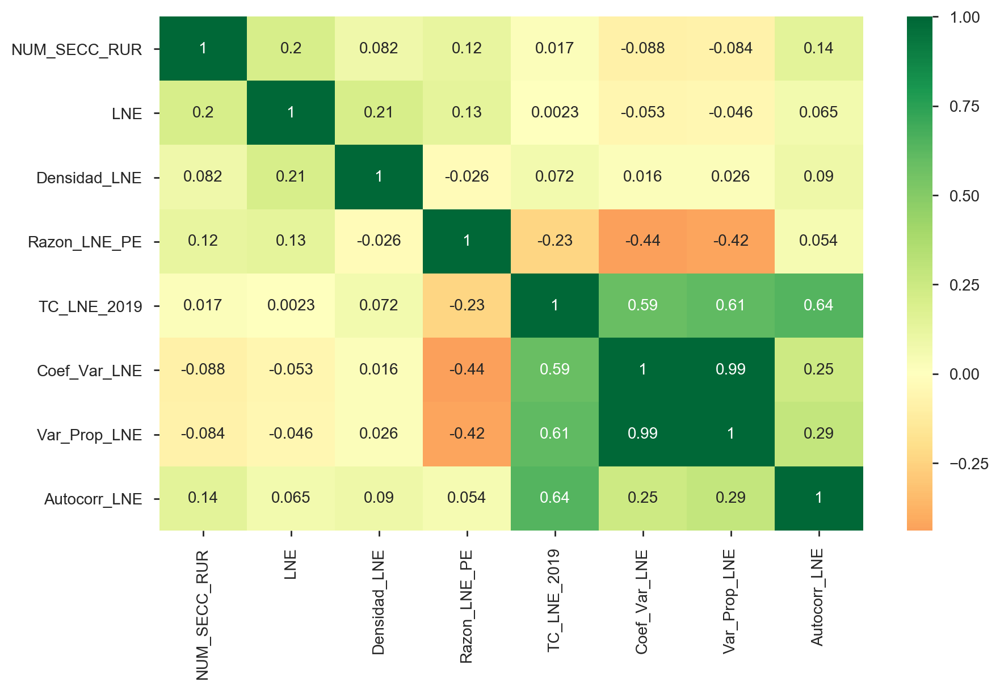

In [10]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_mun_limpio_f.corr(), xticklabels=datos_mun_limpio_f.corr().columns, yticklabels=datos_mun_limpio_f.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind8.png',dpi=1200)
plt.show() 

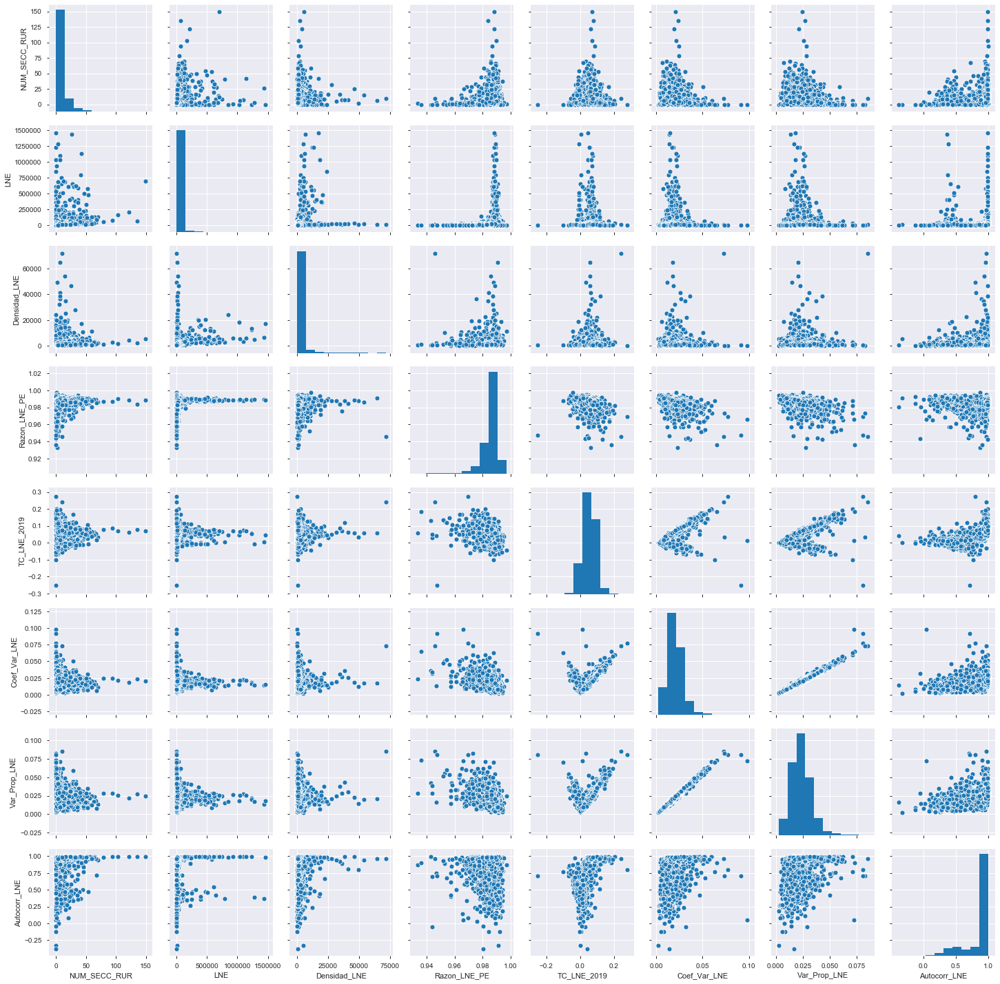

In [11]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr1 = sns.pairplot(datos_mun_limpio_f)
corr1.savefig('Pyplot_correlogram_ind8.png',dpi=1200)

<br>

## ICE municipales

### Preprocesamiento de datos

In [12]:
from sklearn.preprocessing import StandardScaler

#Se crean listas para separar los tipos de datos en el dataframe

#seleccionamos 6 indicadores
ind7 = ['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE']

#seleccionamos 7 indicadores
ind8 = ['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE', 'Autocorr_LNE']

#etiquetas
labels = ['EDO', 'NOMBRE_ESTADO', 'MUN', 'NOMBRE_MUNICIPIO']

#seleccionamos solo los valores de los 7 indicadores (sin Var_Prop_LNE)
x = datos_mun_limpio.loc[:, ind7].values

#seleccionamos solo los valores de los 6 indicadores
x2 = datos_mun_limpio.loc[:, ind8].values

#seleccionamos las labels (no se usará en el k-medias)
y = datos_mun_limpio.loc[:,labels].values

print(x.shape)
print(x2.shape)
print(y.shape)

(2456, 7)
(2456, 8)
(2456, 4)


In [13]:
#para verificar que no haya valores nulos o infinitos en ind7
print(np.any(np.isnan(x)))
print(np.all(np.isfinite(x)))
#para verificar que no haya valores nulos o infinitos en ind8
print(np.any(np.isnan(x2)))
print(np.all(np.isfinite(x2)))

False
True
False
True


In [14]:
#Estandarizamos los valores de ind7 (normalización)
x = StandardScaler().fit_transform(x)
print(x.shape)

#Estandarizamos los valores de ind8 (normalización)
x2 = StandardScaler().fit_transform(x2)
print(x2.shape)

(2456, 7)
(2456, 8)


### Análisis de Componentes Principales (ACP) con 7 indicadores

In [15]:
from sklearn.decomposition import PCA

#calculo de PCA con 3 componentes, y obtención de los valores de CP para cada municipio
pca_3cp = PCA(n_components=3)
pca_ind7 = pca_3cp.fit_transform(x)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=3): %s'
      % str(pca_3cp.explained_variance_ratio_))

#dataframe con los valores de los CP por municipio
df_pca_ind7 = pd.DataFrame(data = pca_ind7
             , columns = ['CP1', 'CP2', 'CP3'])
df_pca_ind7

Razón de varianza explicada por cada CP (n_components=3): [0.30447296 0.21467388 0.15110707]


,CP1,CP2,CP3
0,-0.977398,0.028042,0.063097
1,-3.305609,-0.809967,0.532808
2,-2.703711,-0.620490,0.542320
3,-2.515591,-0.453120,0.098471
4,-2.526716,-0.502715,0.527982
...,...,...,...
2451,0.474839,-0.023246,-0.549936
2452,0.839216,1.142958,-0.860098
2453,1.811809,0.107685,-0.395599
2454,0.826509,-0.159580,-0.518258


In [16]:
#obtención de los pesos por cada variable
pca_pesos_ind7 = pca_3cp.components_
print(pca_pesos_ind7)

#transformación a un dataframe:
df_pca_pesos_ind7 = pd.DataFrame(pca_pesos_ind7, columns=ind7)
principal_components_pesos = pd.DataFrame(['CP1','CP2','CP3'])
df_pca_pesos_ind7.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind7.to_csv(r'Resultados_Mun_PCA_pesos_ind7.csv', index = None)

df_pca_pesos_ind7=df_pca_pesos_ind7.set_index('Componentes Principales')
df_pca_pesos_ind7

[[-0.0094399  -0.02195796  0.08598414 -0.32319219  0.61512156  0.54740919
   0.45776732]
 [ 0.50752461  0.52650158  0.35190477  0.40941701  0.10344052 -0.19541827
   0.35336576]
 [-0.07480004  0.36865871  0.64765623 -0.4748793  -0.16759638  0.15552595
  -0.40155934]]


,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Autocorr_LNE
Componentes Principales,,,,,,,
CP1,-0.009440,-0.021958,0.085984,-0.323192,0.615122,0.547409,0.457767
CP2,0.507525,0.526502,0.351905,0.409417,0.103441,-0.195418,0.353366
CP3,-0.074800,0.368659,0.647656,-0.474879,-0.167596,0.155526,-0.401559


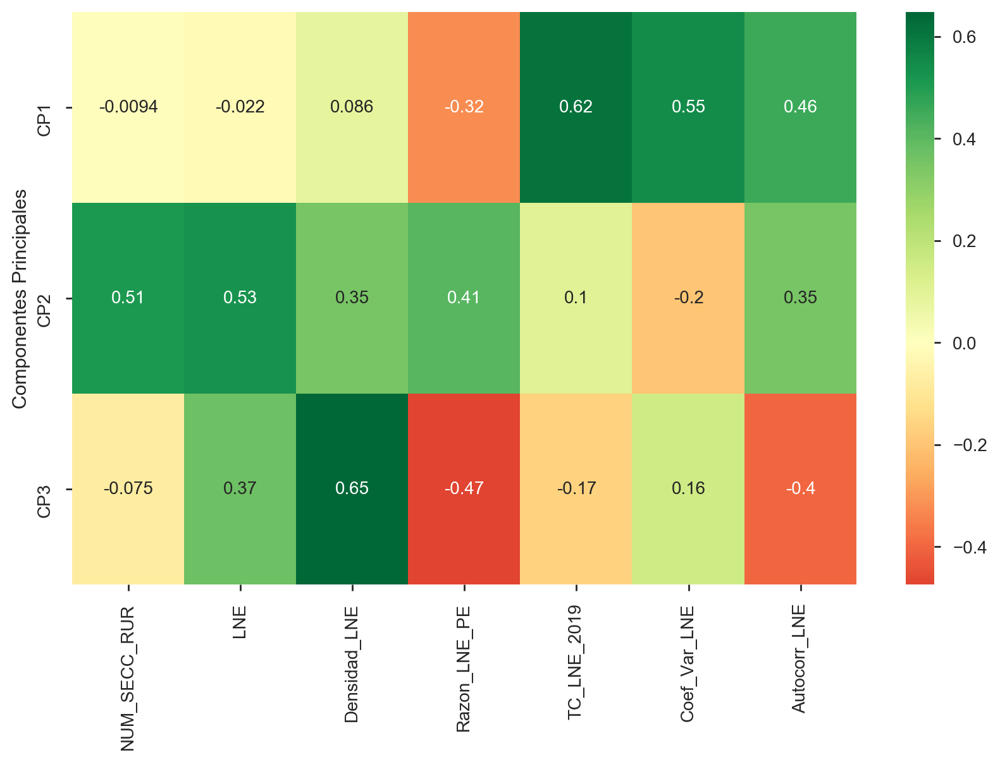

In [17]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind7, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.savefig('Pyplot_PCA_heatmap_ind7.png',dpi=1200)
plt.show() 

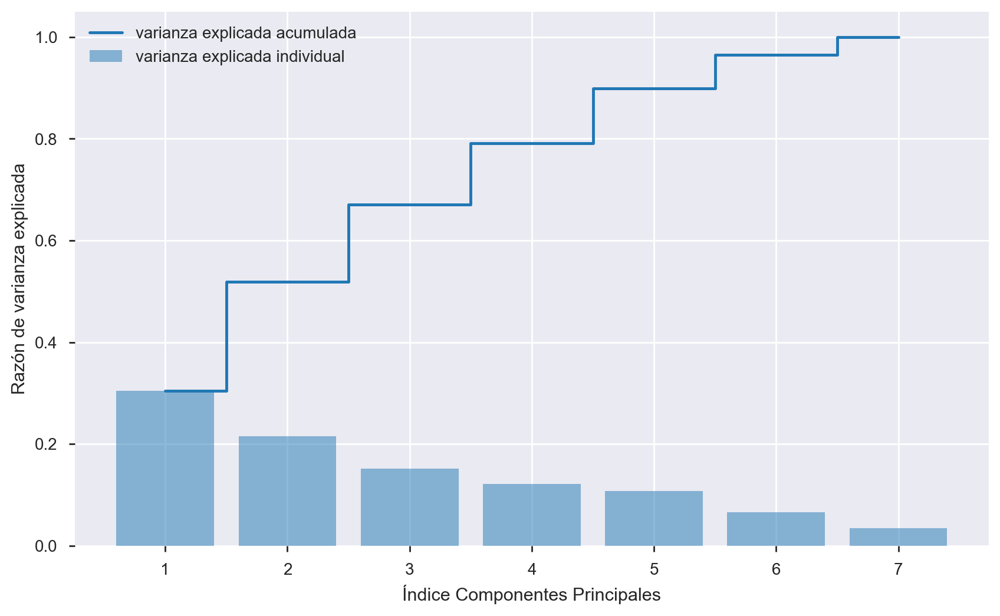

In [18]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,8), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,8), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')

plt.savefig('Pyplot_PCA_variance_ind7.png',dpi=1200)
plt.show()

In [19]:
#concatenamos los resultados con las labels y target
df_pca_results_ind7 = pd.concat([datos_mun_limpio[labels], df_pca_ind7], axis = 1)

#formamos un np-array con las columnas_pca para la sección de métodos de agrupamiento
columnas_pca =  ['CP1', 'CP2', 'CP3']
x_pca = df_pca_results_ind7.loc[:, columnas_pca].values

print(x_pca.shape)
df_pca_results_ind7

(2456, 3)


,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-0.977398,0.028042,0.063097
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-3.305609,-0.809967,0.532808
2,1,AGUASCALIENTES,9,TEPEZALA,-2.703711,-0.620490,0.542320
3,1,AGUASCALIENTES,11,EL LLANO,-2.515591,-0.453120,0.098471
4,1,AGUASCALIENTES,2,ASIENTOS,-2.526716,-0.502715,0.527982
...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.474839,-0.023246,-0.549936
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.839216,1.142958,-0.860098
2453,32,ZACATECAS,44,TABASCO,1.811809,0.107685,-0.395599
2454,32,ZACATECAS,9,CHALCHIHUITES,0.826509,-0.159580,-0.518258


### Análisis de Componentes Principales (ACP) con 8 indicadores

In [20]:
from sklearn.decomposition import PCA

#calculo de PCA con 3 componentes, y obtención de los valores de CP para cada municipio
pca_3cp = PCA(n_components=3)
pca_ind8 = pca_3cp.fit_transform(x2)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=3): %s'
      % str(pca_3cp.explained_variance_ratio_))

#dataframe con los valores de los CP por municipio
df_pca_ind8 = pd.DataFrame(data = pca_ind8
             , columns = ['CP1', 'CP2', 'CP3'])
df_pca_ind8

Razón de varianza explicada por cada CP (n_components=3): [0.36473046 0.19092654 0.13411757]


,CP1,CP2,CP3
0,-1.159709,-0.088926,0.085300
1,-3.440113,-1.285088,0.728496
2,-2.781418,-1.021450,0.718691
3,-2.534965,-0.830443,0.289642
4,-2.431221,-0.916419,0.761197
...,...,...,...
2451,0.252723,0.103555,-0.618837
2452,0.720756,1.253073,-0.777851
2453,2.179487,0.318697,-0.418799
2454,0.719159,0.007821,-0.612772


In [21]:
#obtención de los pesos por cada variable
pca_pesos_ind8 = pca_3cp.components_
print(pca_pesos_ind8)

#transformación a un dataframe:
df_pca_pesos_ind8 = pd.DataFrame(pca_pesos_ind8, columns=ind8)
principal_components_pesos = pd.DataFrame(['CP1','CP2','CP3'])
df_pca_pesos_ind8.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind8.to_csv(r'Resultados_Mun_PCA_pesos_ind8.csv', index = None)

df_pca_pesos_ind8=df_pca_pesos_ind8.set_index('Componentes Principales')
df_pca_pesos_ind8

[[-0.04385441 -0.03814845  0.04182375 -0.29941882  0.47724467  0.53821795
   0.54546709  0.30040845]
 [ 0.48748178  0.49125939  0.35283614  0.34408916  0.22442326 -0.11873876
  -0.09316958  0.45275796]
 [-0.00893522  0.42570399  0.61023084 -0.39020279 -0.24208379  0.12763639
   0.10517391 -0.45617894]]


,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
Componentes Principales,,,,,,,,
CP1,-0.043854,-0.038148,0.041824,-0.299419,0.477245,0.538218,0.545467,0.300408
CP2,0.487482,0.491259,0.352836,0.344089,0.224423,-0.118739,-0.093170,0.452758
CP3,-0.008935,0.425704,0.610231,-0.390203,-0.242084,0.127636,0.105174,-0.456179


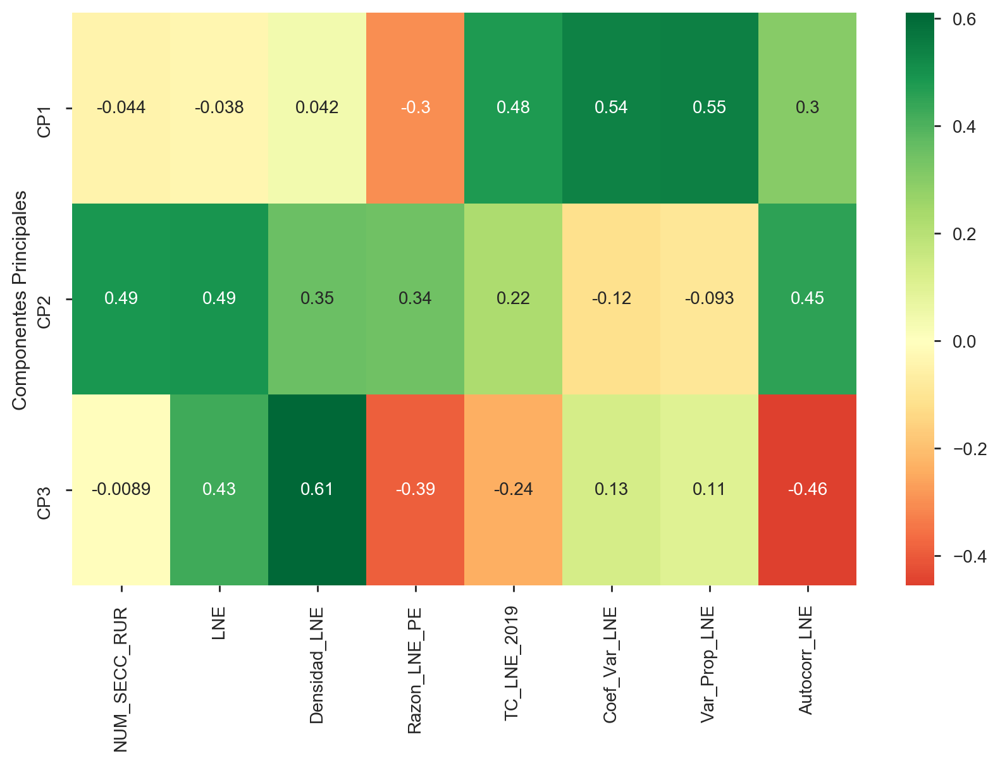

In [22]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind8, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

plt.savefig('Pyplot_PCA_heatmap_ind8.png',dpi=1200)
plt.show() 

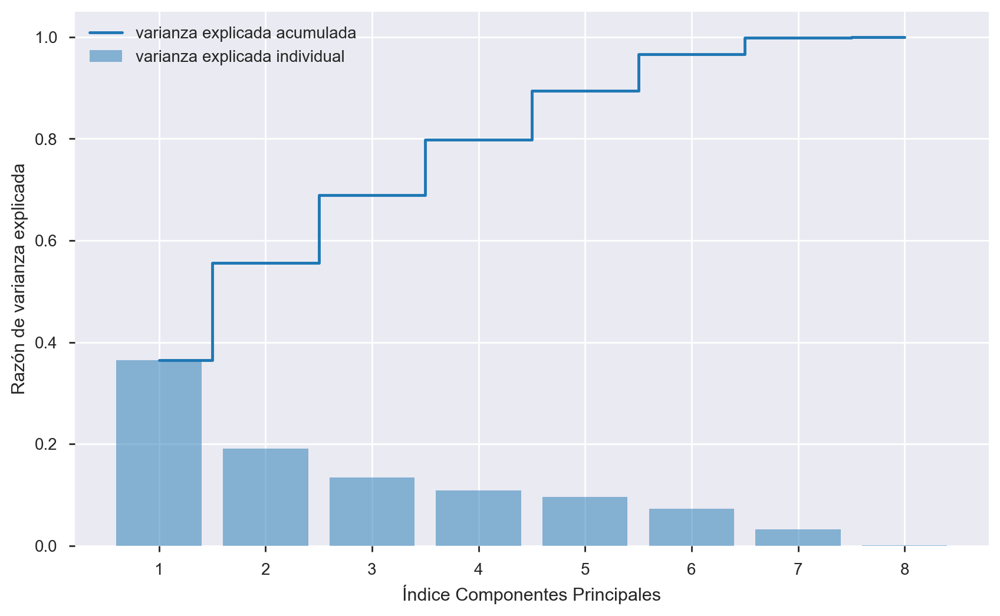

In [23]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x2.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,9), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,9), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')

plt.savefig('Pyplot_PCA_variance_ind8.png',dpi=1200)
plt.show()

In [24]:
#concatenamos los resultados con las labels y target
df_pca_results_ind8 = pd.concat([datos_mun_limpio[labels], df_pca_ind8], axis = 1)

#formamos un np-array con las columnas_pca para la sección de métodos de agrupamiento
columnas_pca =  ['CP1', 'CP2', 'CP3']
x2_pca = df_pca_results_ind8.loc[:, columnas_pca].values

print(x2_pca.shape)
df_pca_results_ind8

(2456, 3)


,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-1.159709,-0.088926,0.085300
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-3.440113,-1.285088,0.728496
2,1,AGUASCALIENTES,9,TEPEZALA,-2.781418,-1.021450,0.718691
3,1,AGUASCALIENTES,11,EL LLANO,-2.534965,-0.830443,0.289642
4,1,AGUASCALIENTES,2,ASIENTOS,-2.431221,-0.916419,0.761197
...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.252723,0.103555,-0.618837
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.720756,1.253073,-0.777851
2453,32,ZACATECAS,44,TABASCO,2.179487,0.318697,-0.418799
2454,32,ZACATECAS,9,CHALCHIHUITES,0.719159,0.007821,-0.612772


### Proyección de los municipios en el espacio de Componentes Principales (7 indicadores)
Gráfica en el espacio CP1, CP2

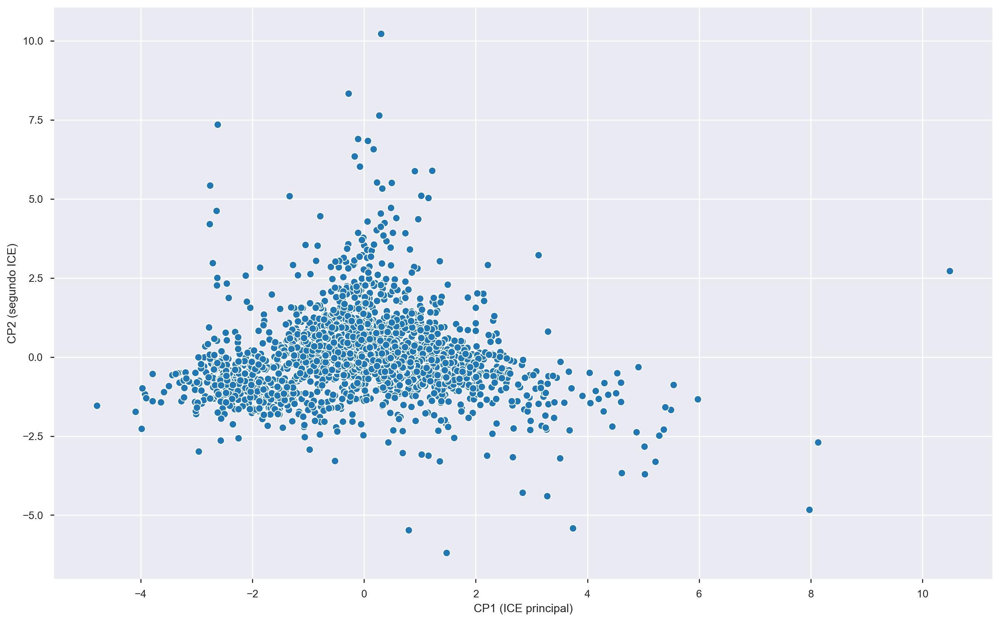

In [25]:
#Scatter plot (seaborn)  PC1 vs PC2
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python)

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind7)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')

plt.savefig('Pyplot_PCA_projection_ind7.png',dpi=1200)

Gráfica en el espacio CP1, CP2, CP3

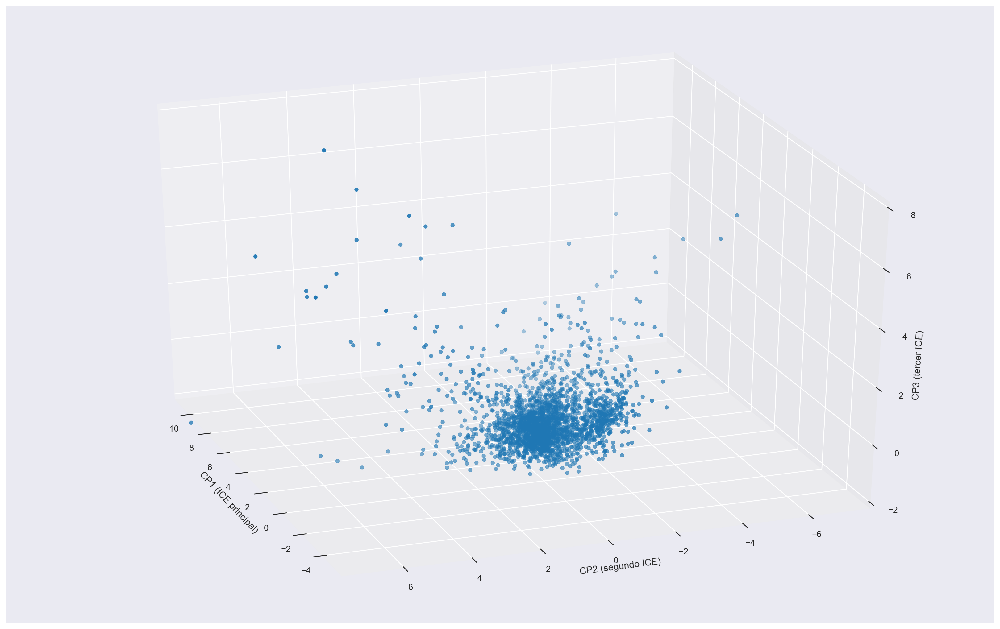

In [26]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind7['CP1'], df_pca_results_ind7['CP2'], df_pca_results_ind7['CP3'],s=20)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-7.5,7.5)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
elev = 30.0
azim = 160.0
ax.view_init(elev, azim)

plt.savefig('Pyplot_PCA_3dprojection_ind7.png',dpi=1200)
pyplot.show()

Gráfica 3d animada

In [27]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind7, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

<br>

### Proyección de los municipios en el espacio de Componentes Principales (8 indicadores)
Gráfica en el espacio CP1, CP2

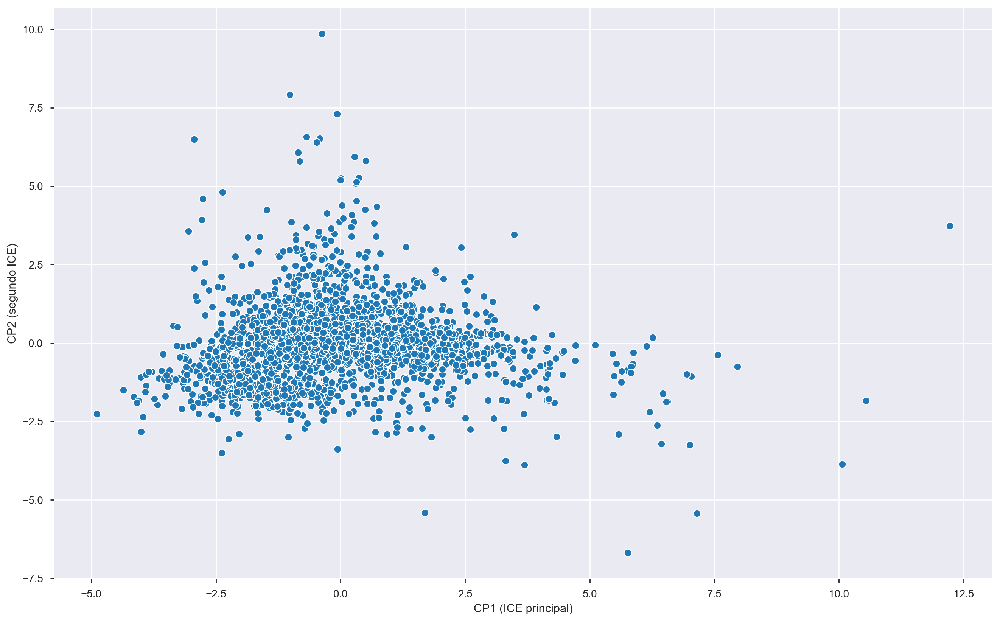

In [28]:
#Scatter plot (seaborn) PC1 vs PC2

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind8)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')

plt.savefig('Pyplot_PCA_projection_ind8.png',dpi=1200)

Gráfica en el espacio CP1, CP2, CP3

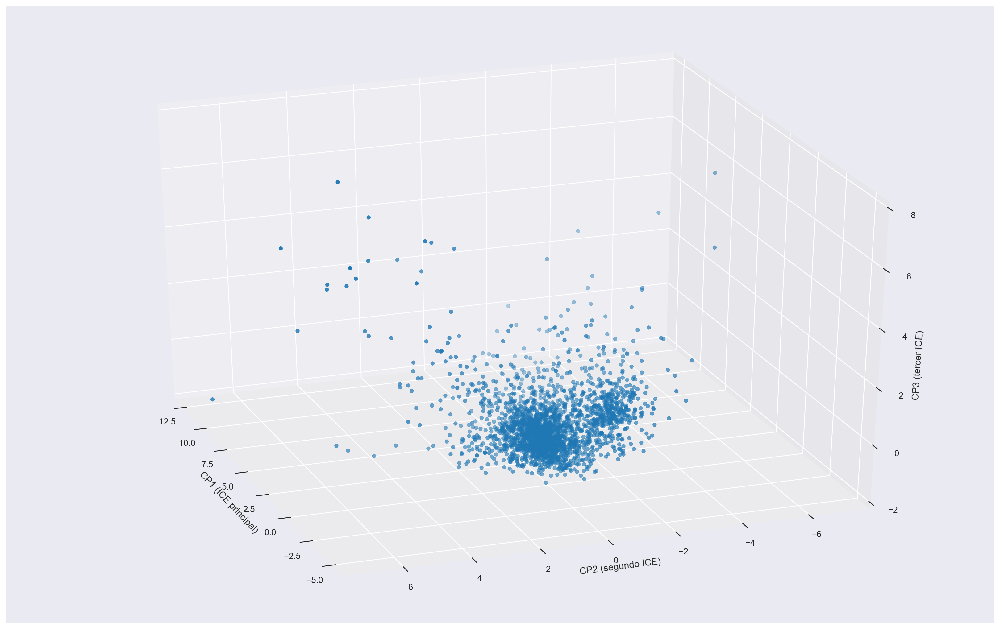

In [29]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind8['CP1'], df_pca_results_ind8['CP2'], df_pca_results_ind8['CP3'],s=20)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-7.5,7.5)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
elev = 30.0
azim = 160.0
ax.view_init(elev, azim)

plt.savefig('Pyplot_PCA_3dprojection_ind8.png',dpi=1200)
pyplot.show()

Gráfica 3d animada

In [30]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind8, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

<br>

## TCE municipal

### Análisis de silueta y configuración óptima de grupos (7 indicadores)
Cálculo de los silhouette_scores para diferentes números de clusters en Kmeans

For n_clusters = 2 The average silhouette_score is : 0.3780623422790195
For n_clusters = 3 The average silhouette_score is : 0.41443241026276284
For n_clusters = 4 The average silhouette_score is : 0.38094307613118344
For n_clusters = 5 The average silhouette_score is : 0.33639419743976173


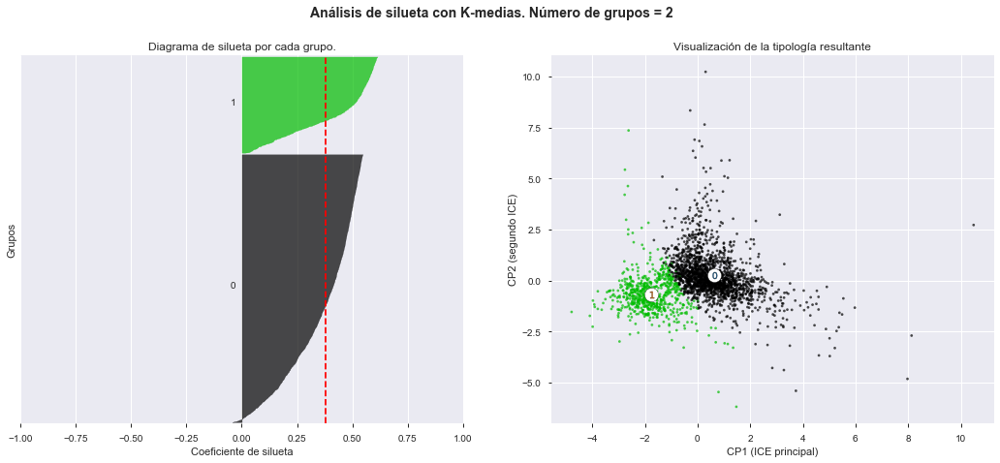

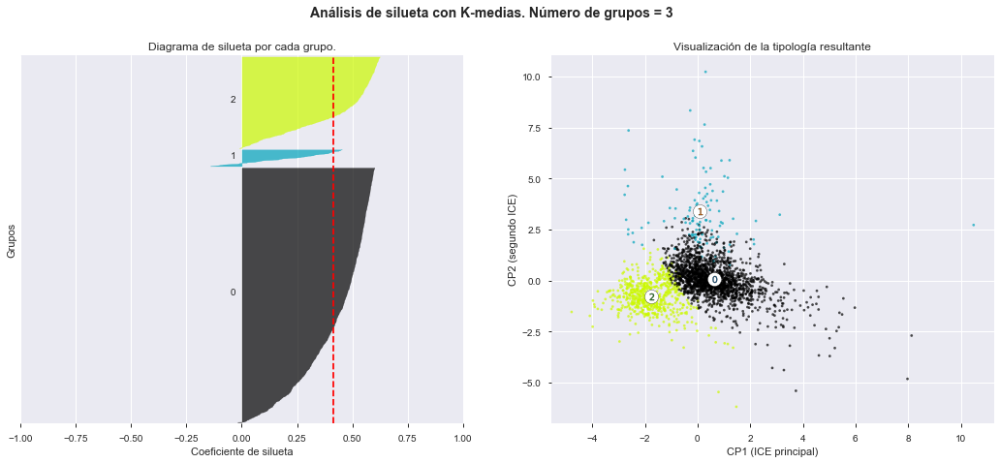

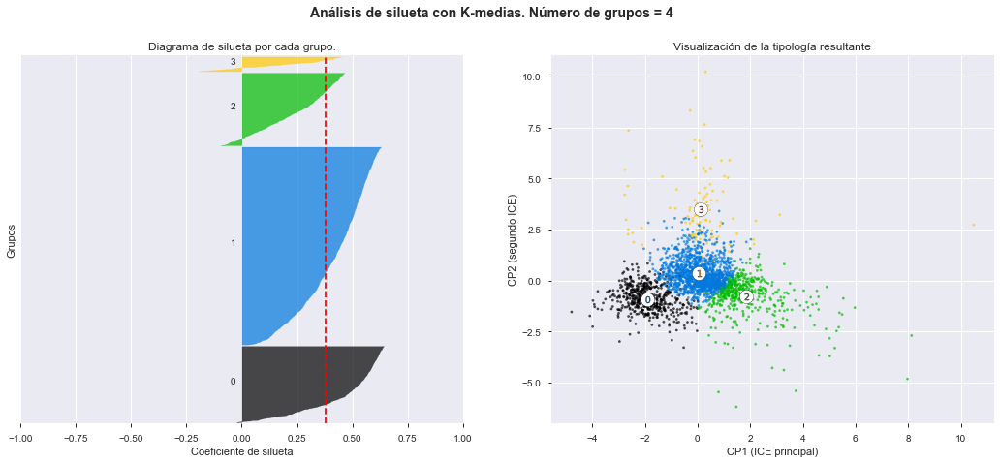

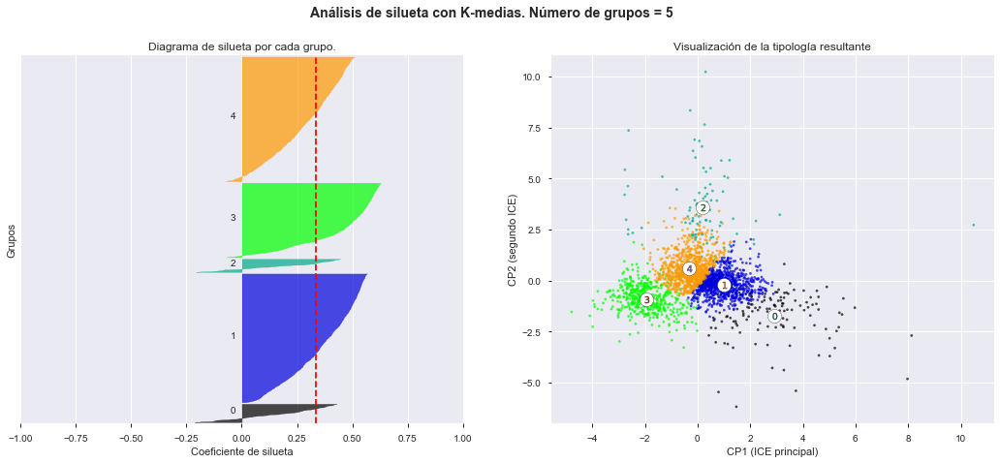

In [31]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

#Datos (3d) en el espacio de las componentes principales
X=x_pca

#numero de clusters/grupos que serán analizados
range_n_clusters = [2, 3, 4, 5]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 0 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de silueta por cada grupo.")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Grupos")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualización de la tipología resultante")
    ax2.set_xlabel("CP1 (ICE principal)")
    ax2.set_ylabel("CP2 (segundo ICE)")

    plt.suptitle(("Análisis de silueta con K-medias. "
                  "Número de grupos = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.savefig('Pyplot_silhouette_score_ind7_Kmeans_'+str(n_clusters)+'.png',dpi=1200)

In [32]:
#se obtienen las etiquetas predichas por K-medias para la configuración con el mayor
#valor promedio del silhouete score (n=3)
num_clusters_ind7 = 3
clusterer_K = KMeans(n_clusters=num_clusters_ind7, random_state=0)
clusterer_K_labels = clusterer_K.fit_predict(X)

#se obtienen las etiquetas predichas por Kmeans
y_pred_kmeans = clusterer_K_labels
#se guarda el nparray en un dataframe
y_pred_kmeans = pd.DataFrame(y_pred_kmeans, columns=['TCE_municipal'])

#se transforman las etiquetas numéricas a str
etiquetas_grupos = {0:'G0', 1:'G1', 2:'G2'}
y_pred_kmeans['TCE_municipal']=y_pred_kmeans['TCE_municipal'].apply(lambda x: etiquetas_grupos[x])

#concatenamos los resultados de PCA con las etiquetas de Kmeans
df_pca_results_ind7_kmeans = pd.concat([df_pca_results_ind7, y_pred_kmeans], axis = 1)

#se guardan los resultados en un csv
df_pca_results_ind7_kmeans.to_csv(r'Resultados_Mun_PCA_Kmeans_ind7.csv', index = None)

df_pca_results_ind7_kmeans

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3,TCE_municipal
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-0.977398,0.028042,0.063097,G2
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-3.305609,-0.809967,0.532808,G2
2,1,AGUASCALIENTES,9,TEPEZALA,-2.703711,-0.620490,0.542320,G2
3,1,AGUASCALIENTES,11,EL LLANO,-2.515591,-0.453120,0.098471,G2
4,1,AGUASCALIENTES,2,ASIENTOS,-2.526716,-0.502715,0.527982,G2
...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.474839,-0.023246,-0.549936,G0
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.839216,1.142958,-0.860098,G0
2453,32,ZACATECAS,44,TABASCO,1.811809,0.107685,-0.395599,G0
2454,32,ZACATECAS,9,CHALCHIHUITES,0.826509,-0.159580,-0.518258,G0


### Análisis de silueta y configuración óptima de grupos (8 indicadores)
Cálculo de los silhouette_scores para diferentes números de clusters en Kmeans

For n_clusters = 2 The average silhouette_score is : 0.31750792769396097
For n_clusters = 3 The average silhouette_score is : 0.32910688124728754
For n_clusters = 4 The average silhouette_score is : 0.36210015036193083
For n_clusters = 5 The average silhouette_score is : 0.35238642380774426


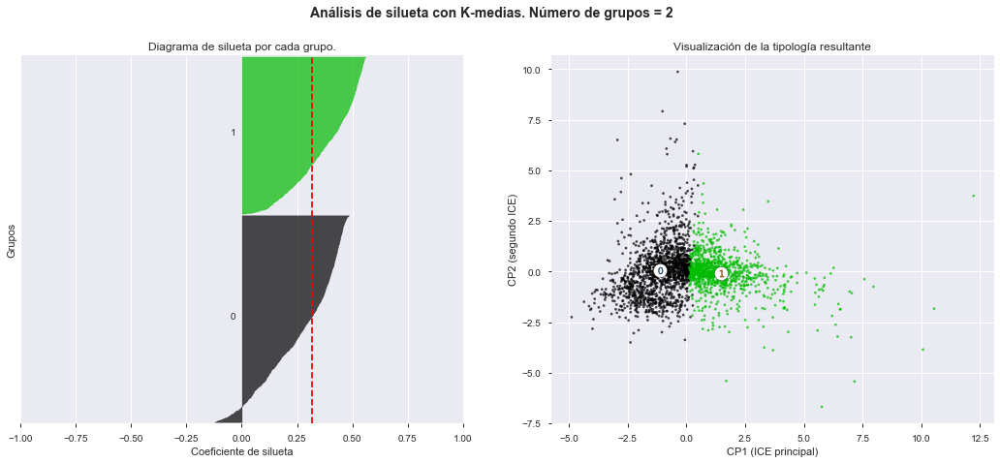

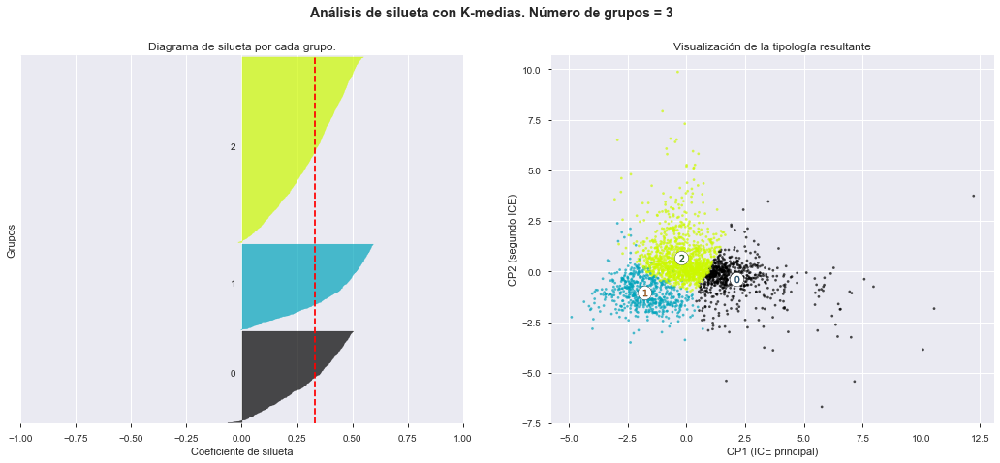

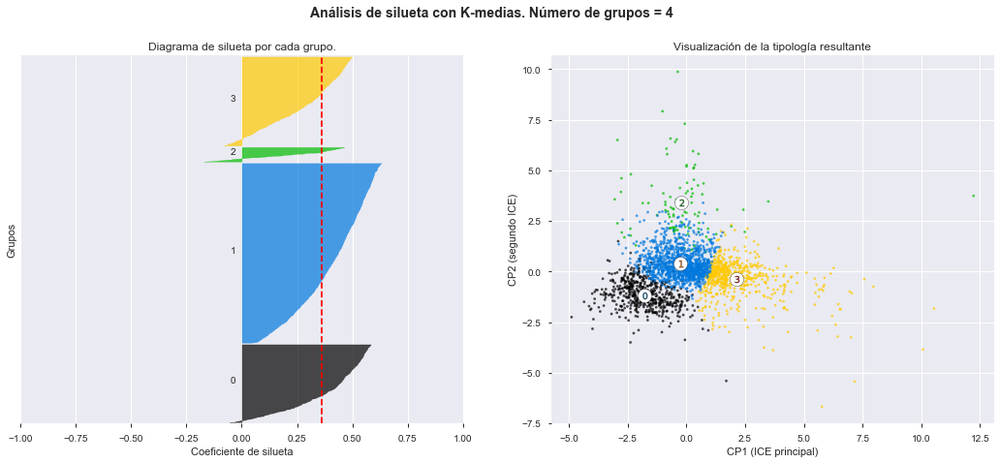

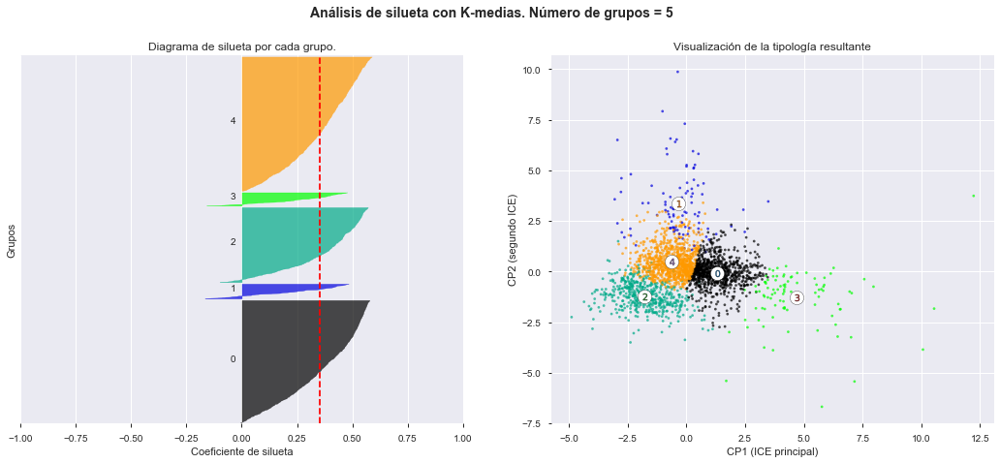

In [33]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

#Datos (3d) en el espacio de las componentes principales
X=x2_pca

#numero de clusters/grupos que serán analizados
range_n_clusters = [2, 3, 4, 5]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 0 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de silueta por cada grupo.")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Grupos")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visualización de la tipología resultante")
    ax2.set_xlabel("CP1 (ICE principal)")
    ax2.set_ylabel("CP2 (segundo ICE)")

    plt.suptitle(("Análisis de silueta con K-medias. "
                  "Número de grupos = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.savefig('Pyplot_silhouette_score_ind8_Kmeans_'+str(n_clusters)+'.png',dpi=1200)

In [34]:
#se obtienen las etiquetas predichas por K-medias para la configuración con el mayor
#valor promedio del silhouete score (n=5)
num_clusters_ind8 = 5
clusterer_K = KMeans(n_clusters=num_clusters_ind8, random_state=0)
clusterer_K_labels = clusterer_K.fit_predict(X)

#se obtienen las etiquetas predichas por Kmeans
y_pred_kmeans = clusterer_K_labels
#se guarda el nparray en un dataframe
y_pred_kmeans = pd.DataFrame(y_pred_kmeans, columns=['TCE_municipal'])

#se transforman las etiquetas numéricas a str (adecuacion para preservar color de anteriores graficas)
etiquetas_grupos = {0:'G0', 1:'G4', 2:'G2', 3:'G3', 4:'G1'}
y_pred_kmeans['TCE_municipal']=y_pred_kmeans['TCE_municipal'].apply(lambda x: etiquetas_grupos[x])

#concatenamos los resultados de PCA con las etiquetas de Kmeans
df_pca_results_ind8_kmeans = pd.concat([df_pca_results_ind8, y_pred_kmeans], axis = 1)

#se guardan los resultados en un csv
df_pca_results_ind8_kmeans.to_csv(r'Resultados_Mun_PCA_Kmeans_ind8.csv', index = None)

df_pca_results_ind8_kmeans

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3,TCE_municipal
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-1.159709,-0.088926,0.085300,G1
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-3.440113,-1.285088,0.728496,G2
2,1,AGUASCALIENTES,9,TEPEZALA,-2.781418,-1.021450,0.718691,G2
3,1,AGUASCALIENTES,11,EL LLANO,-2.534965,-0.830443,0.289642,G2
4,1,AGUASCALIENTES,2,ASIENTOS,-2.431221,-0.916419,0.761197,G2
...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.252723,0.103555,-0.618837,G1
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.720756,1.253073,-0.777851,G0
2453,32,ZACATECAS,44,TABASCO,2.179487,0.318697,-0.418799,G0
2454,32,ZACATECAS,9,CHALCHIHUITES,0.719159,0.007821,-0.612772,G0


<br>

## Implementación de K-medias con la configuración óptima (para 8 indicadores)

Se utiliza la última iteración guardada de K-medias para asegurar la reproducibilidad de los resultados (recordando que K-medias es un algoritmo estocástico; y por lo tanto, en cada iteración hay variaciones en la asignación de grupos).

In [35]:
#df_pca_results_ind8_kmeans = pd.read_csv("Resultados_Mun_PCA_Kmeans_ind8.csv", dtype={'EDO':int,'MUN':int,'CP1':float, 'CP2':float, 'CP3':float})
df_pca_results_ind8_kmeans

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3,TCE_municipal
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-1.159709,-0.088926,0.085300,G1
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-3.440113,-1.285088,0.728496,G2
2,1,AGUASCALIENTES,9,TEPEZALA,-2.781418,-1.021450,0.718691,G2
3,1,AGUASCALIENTES,11,EL LLANO,-2.534965,-0.830443,0.289642,G2
4,1,AGUASCALIENTES,2,ASIENTOS,-2.431221,-0.916419,0.761197,G2
...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.252723,0.103555,-0.618837,G1
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.720756,1.253073,-0.777851,G0
2453,32,ZACATECAS,44,TABASCO,2.179487,0.318697,-0.418799,G0
2454,32,ZACATECAS,9,CHALCHIHUITES,0.719159,0.007821,-0.612772,G0


Gráfica en el espacio CP1, CP2

In [36]:
#se define diccionario de colores
color_dict = dict({'G0':'blue',
                  'G1':'green',
                  'G2': 'orange',
                  'G3': 'red',
                  'G4': 'grey'})

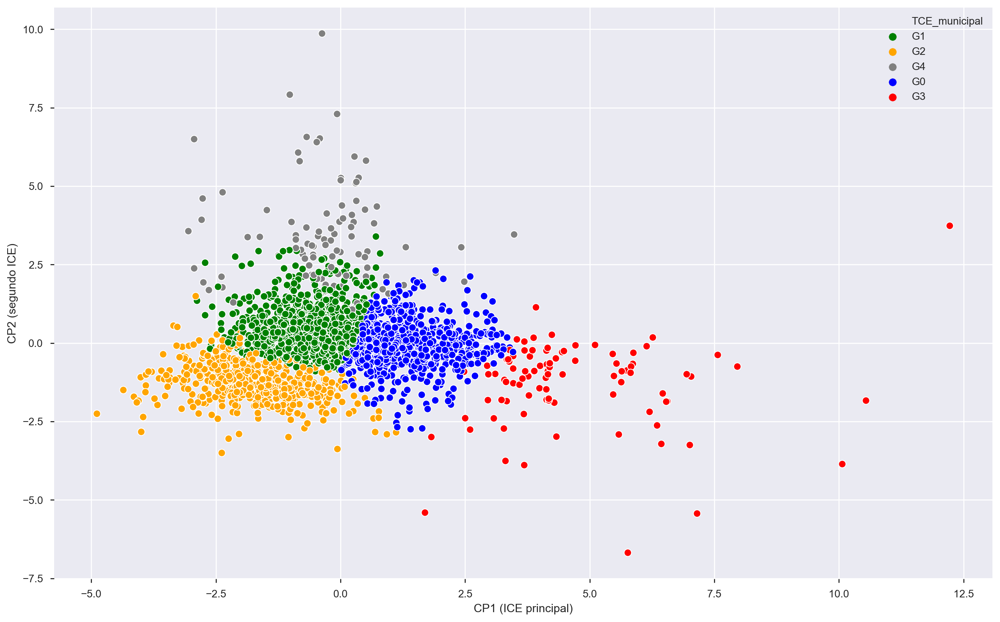

In [37]:
#Scatter plot (seaborn) PC1 vs PC2 (con clustering k-means)

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind8_kmeans, 
                hue="TCE_municipal",
                palette=color_dict)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')

plt.savefig('Pyplot_PCA_Kmeans_ind8.png',dpi=1200)

Gráfica en el espacio CP1, CP2, CP3

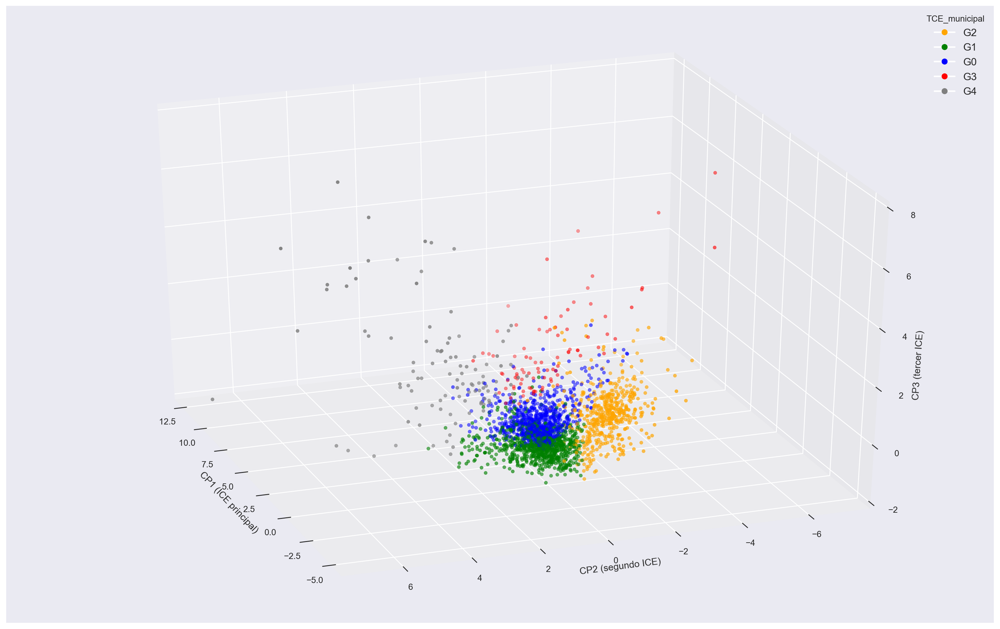

In [38]:
#para definir los colores
colores = df_pca_results_ind8_kmeans['TCE_municipal'].apply(lambda x: color_dict[x])

#personalizar leyenda
legend_elements = [Line2D([0], [0], marker='o', markerfacecolor='orange', color='w', label='G2'),
                   Line2D([0], [0], marker='o', markerfacecolor='green', color='w', label='G1'),
                   Line2D([0], [0], marker='o', markerfacecolor='blue', color='w', label='G0'),
                  Line2D([0], [0], marker='o', markerfacecolor='red', color='w', label='G3'),
                  Line2D([0], [0], marker='o', markerfacecolor='grey', color='w', label='G4')]

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind8_kmeans['CP1'], df_pca_results_ind8_kmeans['CP2'], df_pca_results_ind8_kmeans['CP3'], c=colores,s=15)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-7.5,7.5)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
elev = 30.0
azim = 160.0
ax.view_init(elev, azim)
ax.legend(title='TCE_municipal', handles=legend_elements, loc='upper right',fontsize='large')

plt.savefig('Pyplot_PCA_3d_Kmeans_ind8.png',dpi=1200)
pyplot.show()

Gráfica 3d animada

In [39]:
#3-d plot con plotly
# fig = px.scatter_3d(df_pca_results_ind8_kmeans, x='CP1', y='CP2', z='CP3',
#               color='TCE_municipal',
#                     color_discrete_map={
#                 'G0':'blue',
#                   'G1':'green',
#                   'G2': 'orange',
#                   'G3': 'red',
#                   'G4': 'black'})
# fig.update_traces(mode='markers', marker_line_width=1, marker_size=3)
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

<br>

## Análisis estadístico de los ICE y la TCE municipal (K-medias)

In [40]:
#metadatos e indicadores de los municipios
datos_mun_limpio

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,2133.223463,0.991803,0.000289,0.008345,0.008887,0.237061
2,1,AGUASCALIENTES,9,TEPEZALA,6,15545.0,2478.675412,0.990635,0.005108,0.011777,0.011921,0.344567
3,1,AGUASCALIENTES,11,EL LLANO,6,15067.0,1505.749552,0.991016,-0.003373,0.012239,0.014232,0.504020
4,1,AGUASCALIENTES,2,ASIENTOS,11,34222.0,1484.722551,0.989080,0.001874,0.013432,0.015397,0.374738
...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,13,6959.0,515.205401,0.983523,0.066677,0.019408,0.021905,0.959378
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,32,17372.0,1014.159112,0.986450,0.082705,0.022769,0.026072,0.984897
2453,32,ZACATECAS,44,TABASCO,16,12527.0,1453.217492,0.983221,0.100307,0.029823,0.035416,0.993335
2454,32,ZACATECAS,9,CHALCHIHUITES,10,8222.0,599.837116,0.982861,0.075052,0.021097,0.024771,0.988608


In [41]:
df_pca_results_ind8_kmeans

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,CP1,CP2,CP3,TCE_municipal
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,-1.159709,-0.088926,0.085300,G1
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,-3.440113,-1.285088,0.728496,G2
2,1,AGUASCALIENTES,9,TEPEZALA,-2.781418,-1.021450,0.718691,G2
3,1,AGUASCALIENTES,11,EL LLANO,-2.534965,-0.830443,0.289642,G2
4,1,AGUASCALIENTES,2,ASIENTOS,-2.431221,-0.916419,0.761197,G2
...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,0.252723,0.103555,-0.618837,G1
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.720756,1.253073,-0.777851,G0
2453,32,ZACATECAS,44,TABASCO,2.179487,0.318697,-0.418799,G0
2454,32,ZACATECAS,9,CHALCHIHUITES,0.719159,0.007821,-0.612772,G0


In [42]:
#unimos los resultados de PCA_Kmeans con los metadatos y los 8 indicadores de los municipios
df_indi_pca_kmeans=pd.merge(datos_mun_limpio, df_pca_results_ind8_kmeans, on=['EDO','NOMBRE_ESTADO','MUN','NOMBRE_MUNICIPIO'], how='inner')

#renombramos algunas columnas_pca
df_indi_pca_kmeans=df_indi_pca_kmeans.rename(columns={"CP1": "CP1 (ICE principal)", "CP2": "CP2 (segundo ICE)", "CP3": "CP3 (tercer ICE)"})

df_indi_pca_kmeans

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),TCE_municipal
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939,-1.159709,-0.088926,0.085300,G1
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,2133.223463,0.991803,0.000289,0.008345,0.008887,0.237061,-3.440113,-1.285088,0.728496,G2
2,1,AGUASCALIENTES,9,TEPEZALA,6,15545.0,2478.675412,0.990635,0.005108,0.011777,0.011921,0.344567,-2.781418,-1.021450,0.718691,G2
3,1,AGUASCALIENTES,11,EL LLANO,6,15067.0,1505.749552,0.991016,-0.003373,0.012239,0.014232,0.504020,-2.534965,-0.830443,0.289642,G2
4,1,AGUASCALIENTES,2,ASIENTOS,11,34222.0,1484.722551,0.989080,0.001874,0.013432,0.015397,0.374738,-2.431221,-0.916419,0.761197,G2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,13,6959.0,515.205401,0.983523,0.066677,0.019408,0.021905,0.959378,0.252723,0.103555,-0.618837,G1
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,32,17372.0,1014.159112,0.986450,0.082705,0.022769,0.026072,0.984897,0.720756,1.253073,-0.777851,G0
2453,32,ZACATECAS,44,TABASCO,16,12527.0,1453.217492,0.983221,0.100307,0.029823,0.035416,0.993335,2.179487,0.318697,-0.418799,G0
2454,32,ZACATECAS,9,CHALCHIHUITES,10,8222.0,599.837116,0.982861,0.075052,0.021097,0.024771,0.988608,0.719159,0.007821,-0.612772,G0


<br>

## Gráficas (pair-plot, box-plots, violin-plots)

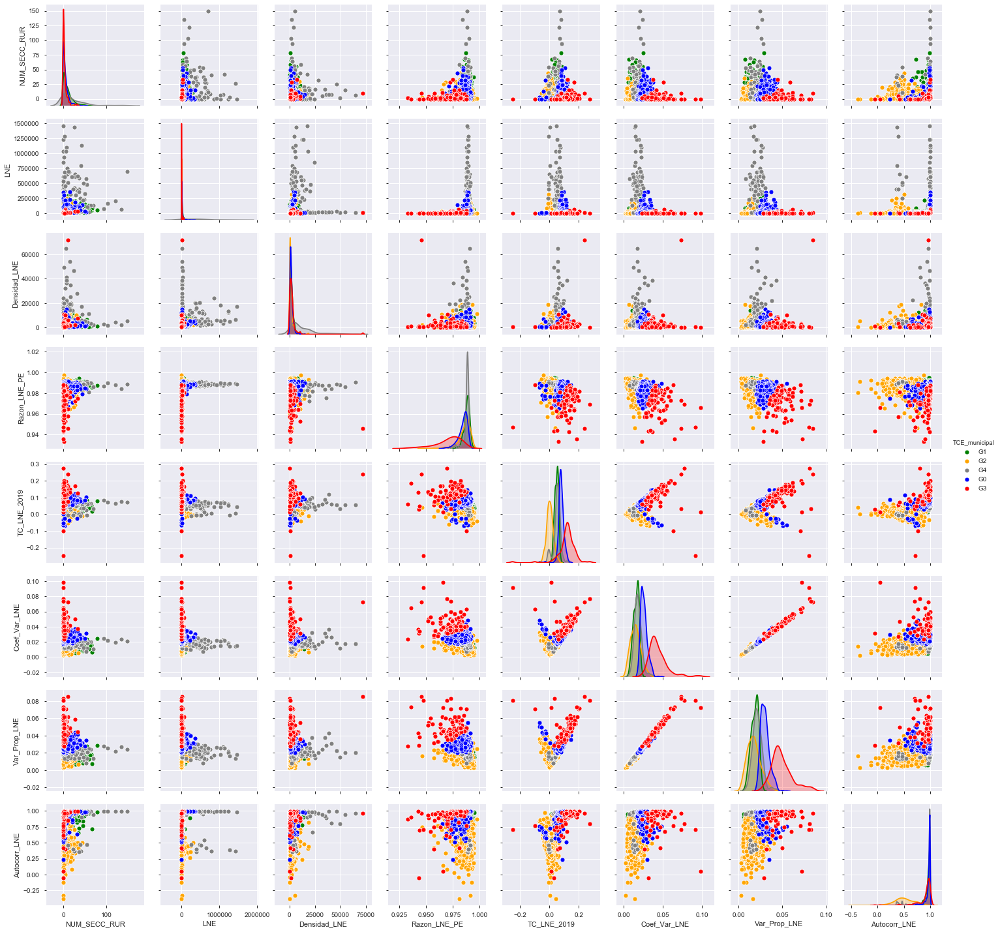

In [43]:
#sólo tomamos los indicadores y grupos
df_indi_pca_kmeans_f = df_indi_pca_kmeans[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE', 'Autocorr_LNE', 'TCE_municipal']]
#pair-plot (colores en funcion de grupo)
corr3=sns.pairplot(df_indi_pca_kmeans_f, 
                   hue="TCE_municipal",
                   palette=color_dict)

#guardar la pair-plot
corr3.savefig('Pyplot_correlogram_ind8-TCE.png',dpi=1200)

Gráfica de caja (por grupos, para el indicador "Coef_Var_LNE")

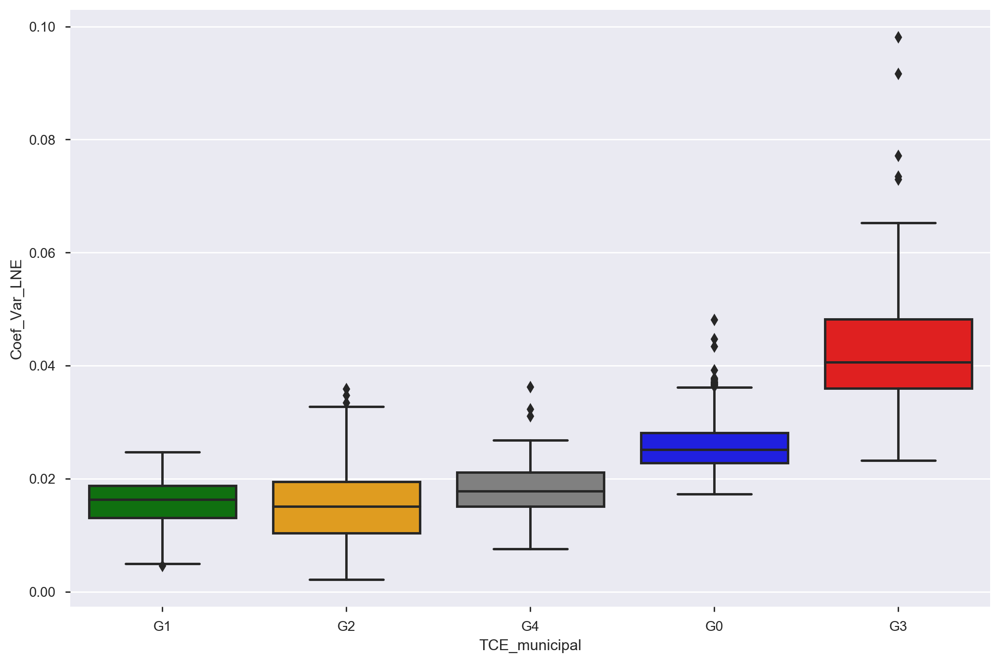

In [44]:
plt.figure(figsize=(12, 8), dpi= 200, facecolor='w', edgecolor='k')
sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Coef_Var_LNE"], palette=color_dict);
plt.show()

Plotgrid de gráficas de caja para cada indicador e índice de complejidad electoral (por grupo)

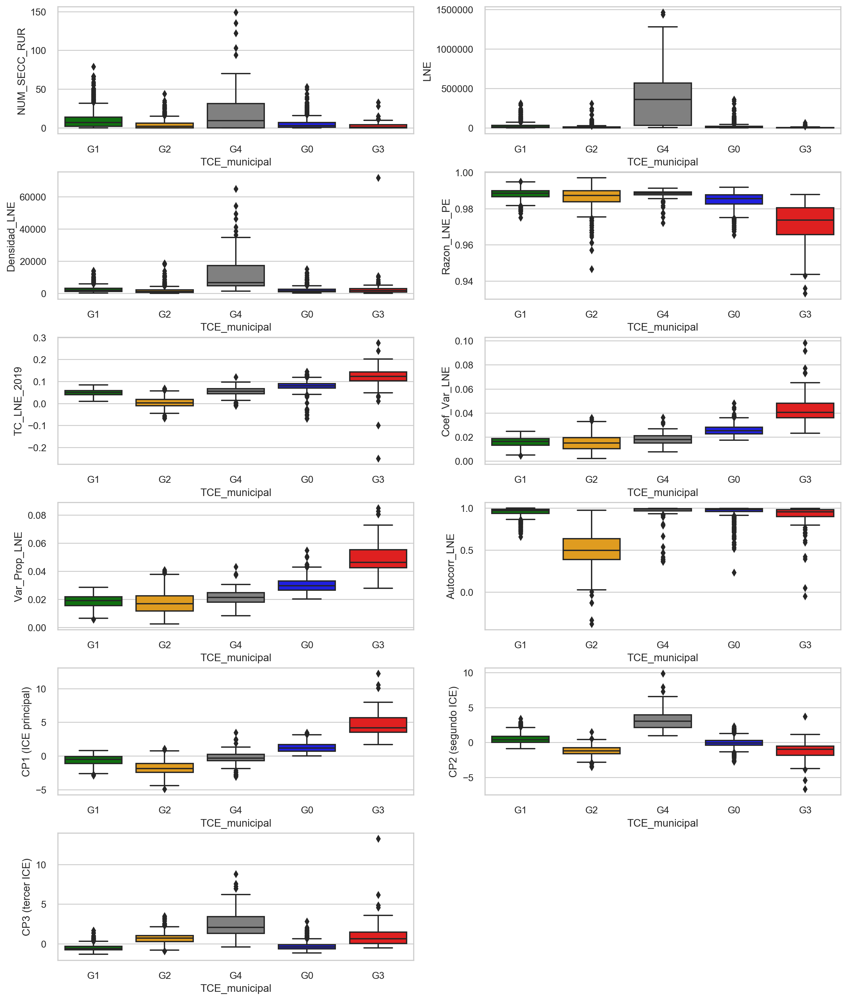

In [45]:
sns.set(style="whitegrid")
fig, axes = plt.subplots(6, 2, figsize=(16, 20), dpi= 200)

ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["NUM_SECC_RUR"], palette=color_dict, orient='v', 
    ax=axes[0, 0])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["LNE"], palette=color_dict, orient='v', 
    ax=axes[0, 1])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Densidad_LNE"], palette=color_dict, orient='v', 
    ax=axes[1, 0])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Razon_LNE_PE"], palette=color_dict, orient='v', 
    ax=axes[1, 1])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["TC_LNE_2019"], palette=color_dict, orient='v', 
    ax=axes[2, 0])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Coef_Var_LNE"], palette=color_dict, orient='v', 
    ax=axes[2, 1])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Var_Prop_LNE"], palette=color_dict, orient='v', 
    ax=axes[3, 0])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Autocorr_LNE"], palette=color_dict, orient='v', 
    ax=axes[3, 1])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["CP1 (ICE principal)"], palette=color_dict, orient='v', 
    ax=axes[4, 0])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["CP2 (segundo ICE)"], palette=color_dict, orient='v', 
    ax=axes[4, 1])
ax = sns.boxplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["CP3 (tercer ICE)"], palette=color_dict, orient='v', 
    ax=axes[5, 0])

fig.delaxes(axes[5][1]) #borrar subplot sin usar
plt.subplots_adjust(hspace=0.3) #dar mas espacio vertical
#se guarda la gráfica
plt.savefig('Pyplot_box-plots-grid.png',dpi=1200)
plt.show()

Gráfica de violín (por grupos, para el indicador "Densidad_LNE")

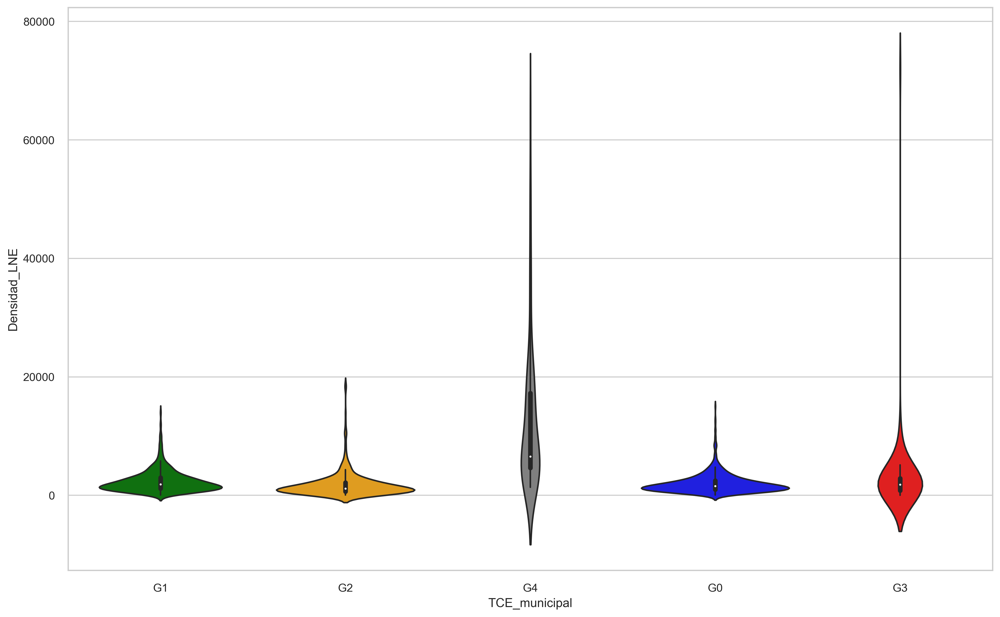

In [46]:
plt.figure(figsize=(16, 10), dpi= 300, facecolor='w', edgecolor='k')
sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Densidad_LNE"], palette=color_dict);
#se guarda la gráfica
plt.savefig('Pyplot_violin.png',dpi=1200)
plt.show()

Plotgrid de gráficas de violín para cada indicador e índice de complejidad electoral (por grupo)

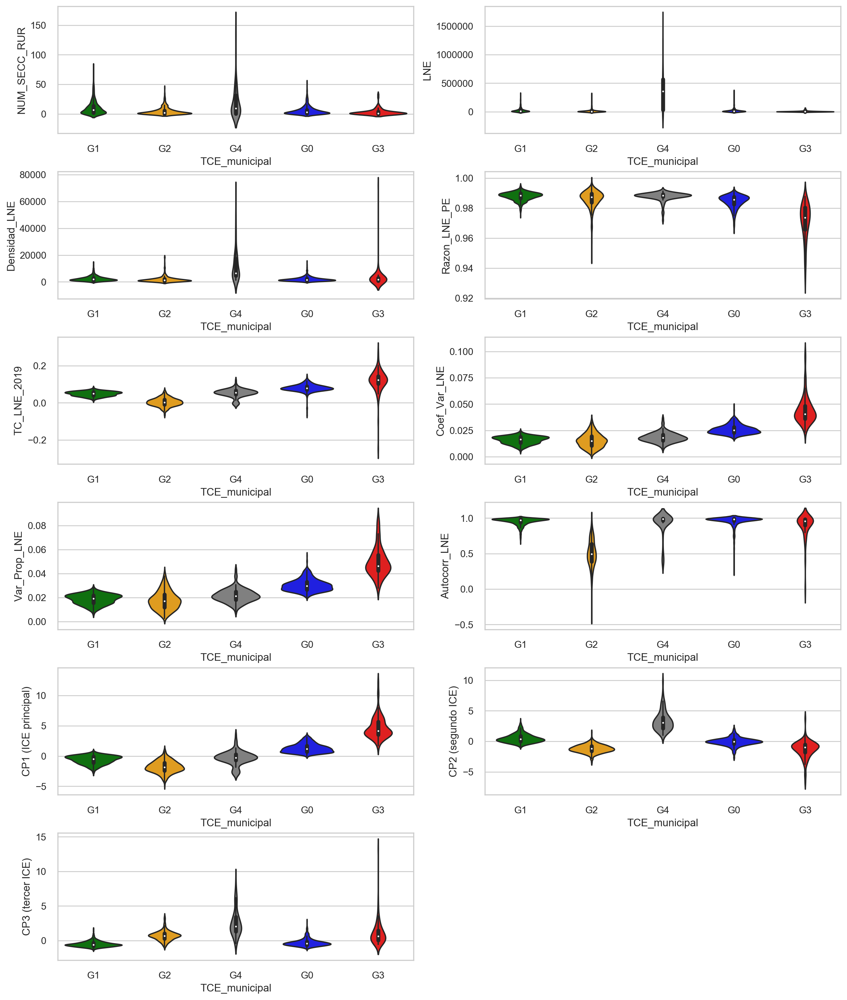

In [47]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(6, 2, figsize=(16, 20), dpi= 200)
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["NUM_SECC_RUR"], palette=color_dict, orient='v', 
    ax=axes[0, 0])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["LNE"], palette=color_dict, orient='v', 
    ax=axes[0, 1])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Densidad_LNE"], palette=color_dict, orient='v', 
    ax=axes[1, 0])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Razon_LNE_PE"], palette=color_dict, orient='v', 
    ax=axes[1, 1])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["TC_LNE_2019"], palette=color_dict, orient='v', 
    ax=axes[2, 0])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Coef_Var_LNE"], palette=color_dict, orient='v', 
    ax=axes[2, 1])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Var_Prop_LNE"], palette=color_dict, orient='v', 
    ax=axes[3, 0])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["Autocorr_LNE"], palette=color_dict, orient='v', 
    ax=axes[3, 1])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["CP1 (ICE principal)"], palette=color_dict, orient='v', 
    ax=axes[4, 0])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["CP2 (segundo ICE)"], palette=color_dict, orient='v', 
    ax=axes[4, 1])
ax = sns.violinplot(x=df_indi_pca_kmeans["TCE_municipal"], y=df_indi_pca_kmeans["CP3 (tercer ICE)"], palette=color_dict, orient='v', 
    ax=axes[5, 0])

fig.delaxes(axes[5][1]) #borrar subplot sin usar
plt.subplots_adjust(hspace=0.3) #dar mas espacio vertical

#se guarda la gráfica
plt.savefig('Pyplot_violin-plot-grid.png',dpi=1200)
plt.show()

<br>

## Identificación de los valores/municipios atípicas respecto a los ICE
Etiquetamos los municipios considerados como atípicos en los ICE (considerando la separación por grupos de la tipología):

In [48]:
#ejemplo:
df_indi_pca_kmeans['CP1 (ICE principal)'].quantile(0.25)

-1.1246975653941844

In [49]:
def IQsR_clusters(x):
    x_0 = x['TCE_municipal'] == 'G0'
    x_g0 = x[x_0]
    Q1_g0 = x_g0['CP1 (ICE principal)'].quantile(0.25)
    Q3_g0 = x_g0['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g0 = Q3_g0 - Q1_g0
    Q1_pc2_g0 =  x_g0['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g0 = x_g0['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g0 = Q3_pc2_g0 - Q1_pc2_g0
    Q1_pc3_g0 =  x_g0['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g0 = x_g0['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g0 = Q3_pc3_g0 - Q1_pc3_g0
    return IQR_pc1_g0+IQR_pc1_g0;

In [50]:
IQsR_clusters(df_indi_pca_kmeans)

1.9634016811701542

Función para calcular el Q1, Q3 e IQR (calculado por grupos de cluster_Kmeans), y posteriormente clasificar los municipios en tipicos o atipicos en el ICE principal, en el segundo ICE, o en el tercer ICE:

In [51]:
def IQR_clusters(x):
    x_0 = df_indi_pca_kmeans['TCE_municipal'] == 'G0'
    x_g0 = df_indi_pca_kmeans[x_0]
    Q1_g0 = x_g0['CP1 (ICE principal)'].quantile(0.25)
    Q3_g0 = x_g0['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g0 = Q3_g0 - Q1_g0
    Q1_pc2_g0 =  x_g0['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g0 = x_g0['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g0 = Q3_pc2_g0 - Q1_pc2_g0
    Q1_pc3_g0 =  x_g0['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g0 = x_g0['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g0 = Q3_pc3_g0 - Q1_pc3_g0
    
    x_1 = df_indi_pca_kmeans['TCE_municipal'] == 'G1'
    x_g1 = df_indi_pca_kmeans[x_1]
    Q1_g1 = x_g1['CP1 (ICE principal)'].quantile(0.25)
    Q3_g1 = x_g1['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g1 = Q3_g1 - Q1_g1
    Q1_pc2_g1 =  x_g1['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g1 = x_g1['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g1 = Q3_pc2_g1 - Q1_pc2_g1
    Q1_pc3_g1 =  x_g1['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g1 = x_g1['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g1 = Q3_pc3_g1 - Q1_pc3_g1
    
    x_2 = df_indi_pca_kmeans['TCE_municipal'] == 'G2'
    x_g2 = df_indi_pca_kmeans[x_2]
    Q1_g2 = x_g2['CP1 (ICE principal)'].quantile(0.25)
    Q3_g2 = x_g2['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g2 = Q3_g2 - Q1_g2
    Q1_pc2_g2 =  x_g2['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g2 = x_g2['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g2 = Q3_pc2_g2 - Q1_pc2_g2
    Q1_pc3_g2 =  x_g2['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g2 = x_g2['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g2 = Q3_pc3_g2 - Q1_pc3_g2
    
    x_3 = df_indi_pca_kmeans['TCE_municipal'] == 'G3'
    x_g3 = df_indi_pca_kmeans[x_3]
    Q1_g3 = x_g3['CP1 (ICE principal)'].quantile(0.25)
    Q3_g3 = x_g3['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g3 = Q3_g3 - Q1_g3
    Q1_pc2_g3 =  x_g3['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g3 = x_g3['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g3 = Q3_pc2_g3 - Q1_pc2_g3
    Q1_pc3_g3 =  x_g3['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g3 = x_g3['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g3 = Q3_pc3_g3 - Q1_pc3_g3
    
    x_4 = df_indi_pca_kmeans['TCE_municipal'] == 'G4'
    x_g4 = df_indi_pca_kmeans[x_4]
    Q1_g4 = x_g4['CP1 (ICE principal)'].quantile(0.25)
    Q3_g4 = x_g4['CP1 (ICE principal)'].quantile(0.75)
    IQR_pc1_g4 = Q3_g4 - Q1_g4
    Q1_pc2_g4 =  x_g4['CP2 (segundo ICE)'].quantile(0.25)
    Q3_pc2_g4 = x_g4['CP2 (segundo ICE)'].quantile(0.75)
    IQR_pc2_g4 = Q3_pc2_g4 - Q1_pc2_g4
    Q1_pc3_g4 =  x_g4['CP3 (tercer ICE)'].quantile(0.25)
    Q3_pc3_g4 = x_g4['CP3 (tercer ICE)'].quantile(0.75)
    IQR_pc3_g4 = Q3_pc3_g4 - Q1_pc3_g4
    
    if (x['TCE_municipal'] == 'G0'):
        if (x['CP1 (ICE principal)'] < Q1_g0-1.5*IQR_pc1_g0) or (x['CP1 (ICE principal)'] > Q3_g0+1.5*IQR_pc1_g0):
            return 'Atipica en CP1'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g0-1.5*IQR_pc2_g0) or (x['CP2 (segundo ICE)'] > Q3_pc2_g0+1.5*IQR_pc2_g0):
            return 'Atipica en CP2'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g0-1.5*IQR_pc3_g0) or (x['CP3 (tercer ICE)'] > Q3_pc3_g0+1.5*IQR_pc3_g0):
            return 'Atipica en CP3'
        else:
            return 'Tipica'
    elif (x['TCE_municipal'] == 'G1'):
        if (x['CP1 (ICE principal)'] < Q1_g1-1.5*IQR_pc1_g1) or (x['CP1 (ICE principal)'] > Q3_g1+1.5*IQR_pc1_g1):
            return 'Atipica en CP1'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g1-1.5*IQR_pc2_g1) or (x['CP2 (segundo ICE)'] > Q3_pc2_g1+1.5*IQR_pc2_g1):
            return 'Atipica en CP2'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g1-1.5*IQR_pc3_g1) or (x['CP3 (tercer ICE)'] > Q3_pc3_g1+1.5*IQR_pc3_g1):
            return 'Atipica en CP3'
        else:
            return 'Tipica'
    elif (x['TCE_municipal'] == 'G2'):
        if (x['CP1 (ICE principal)'] < Q1_g2-1.5*IQR_pc1_g2) or (x['CP1 (ICE principal)'] > Q3_g2+1.5*IQR_pc1_g2):
            return 'Atipica en CP1'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g2-1.5*IQR_pc2_g2) or (x['CP2 (segundo ICE)'] > Q3_pc2_g2+1.5*IQR_pc2_g2):
            return 'Atipica en CP2'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g2-1.5*IQR_pc3_g2) or (x['CP3 (tercer ICE)'] > Q3_pc3_g2+1.5*IQR_pc3_g2):
            return 'Atipica en CP3'
        else:
            return 'Tipica'
    elif (x['TCE_municipal'] == 'G3'):
        if (x['CP1 (ICE principal)'] < Q1_g3-1.5*IQR_pc1_g3) or (x['CP1 (ICE principal)'] > Q3_g3+1.5*IQR_pc1_g3):
            return 'Atipica en CP1'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g3-1.5*IQR_pc2_g3) or (x['CP2 (segundo ICE)'] > Q3_pc2_g3+1.5*IQR_pc2_g3):
            return 'Atipica en CP2'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g3-1.5*IQR_pc3_g3) or (x['CP3 (tercer ICE)'] > Q3_pc3_g3+1.5*IQR_pc3_g3):
            return 'Atipica en CP3'
        else:
            return 'Tipica'
    elif (x['TCE_municipal'] == 'G4'):
        if (x['CP1 (ICE principal)'] < Q1_g4-1.5*IQR_pc1_g4) or (x['CP1 (ICE principal)'] > Q3_g4+1.5*IQR_pc1_g4):
            return 'Atipica en CP1'
        elif (x['CP2 (segundo ICE)'] < Q1_pc2_g4-1.5*IQR_pc2_g4) or (x['CP2 (segundo ICE)'] > Q3_pc2_g4+1.5*IQR_pc2_g4):
            return 'Atipica en CP2'
        elif (x['CP3 (tercer ICE)'] < Q1_pc3_g4-1.5*IQR_pc3_g4) or (x['CP3 (tercer ICE)'] > Q3_pc3_g4+1.5*IQR_pc3_g4):
            return 'Atipica en CP3'
        else:
            return 'Tipica'
    else:
        return 'nan'

In [52]:
#se aplica la función al último df con los resultados:
df_indi_pca_kmeans['Atipicidad'] = df_indi_pca_kmeans.apply(IQR_clusters, axis = 1)

#se muestra el dataframe:
df_indi_pca_kmeans

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),TCE_municipal,Atipicidad
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939,-1.159709,-0.088926,0.085300,G1,Tipica
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,2133.223463,0.991803,0.000289,0.008345,0.008887,0.237061,-3.440113,-1.285088,0.728496,G2,Tipica
2,1,AGUASCALIENTES,9,TEPEZALA,6,15545.0,2478.675412,0.990635,0.005108,0.011777,0.011921,0.344567,-2.781418,-1.021450,0.718691,G2,Tipica
3,1,AGUASCALIENTES,11,EL LLANO,6,15067.0,1505.749552,0.991016,-0.003373,0.012239,0.014232,0.504020,-2.534965,-0.830443,0.289642,G2,Tipica
4,1,AGUASCALIENTES,2,ASIENTOS,11,34222.0,1484.722551,0.989080,0.001874,0.013432,0.015397,0.374738,-2.431221,-0.916419,0.761197,G2,Tipica
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,13,6959.0,515.205401,0.983523,0.066677,0.019408,0.021905,0.959378,0.252723,0.103555,-0.618837,G1,Tipica
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,32,17372.0,1014.159112,0.986450,0.082705,0.022769,0.026072,0.984897,0.720756,1.253073,-0.777851,G0,Tipica
2453,32,ZACATECAS,44,TABASCO,16,12527.0,1453.217492,0.983221,0.100307,0.029823,0.035416,0.993335,2.179487,0.318697,-0.418799,G0,Tipica
2454,32,ZACATECAS,9,CHALCHIHUITES,10,8222.0,599.837116,0.982861,0.075052,0.021097,0.024771,0.988608,0.719159,0.007821,-0.612772,G0,Tipica


In [53]:
#para verificar, imprimimos los valores únicos en la columna Atipicidad.
df_indi_pca_kmeans.Atipicidad.unique()

array(['Tipica', 'Atipica en CP1', 'Atipica en CP2', 'Atipica en CP3'],
      dtype=object)

In [54]:
#imprimimos la frecuencia de los valores únicos en Atipicidad
df_indi_pca_kmeans['Atipicidad'].value_counts()

Tipica            2256
Atipica en CP2      99
Atipica en CP3      69
Atipica en CP1      32
Name: Atipicidad, dtype: int64

In [55]:
#imprimimos el número de municipios por grupo de la tipología.
df_indi_pca_kmeans['TCE_municipal'].value_counts()

G1    916
G0    834
G2    512
G4    102
G3     92
Name: TCE_municipal, dtype: int64

In [56]:
#se guardan los resultados en un csv
df_indi_pca_kmeans.to_csv(r'Resultados_Mun_Indic_PCA_Kmeans_ind8.csv', index = None)

<br>

# Resumen de resultados de los ICE y la TCE municipal

In [57]:
#se carga el dataframe con la ultima version de los resultados:
resultados_final = pd.read_csv("Resultados_Mun_Indic_PCA_Kmeans_ind8.csv", dtype={'EDO':int,'MUN':int})
resultados_final

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),TCE_municipal,Atipicidad
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939,-1.159709,-0.088926,0.085300,G1,Tipica
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,4,6914.0,2133.223463,0.991803,0.000289,0.008345,0.008887,0.237061,-3.440113,-1.285088,0.728496,G2,Tipica
2,1,AGUASCALIENTES,9,TEPEZALA,6,15545.0,2478.675412,0.990635,0.005108,0.011777,0.011921,0.344567,-2.781418,-1.021450,0.718691,G2,Tipica
3,1,AGUASCALIENTES,11,EL LLANO,6,15067.0,1505.749552,0.991016,-0.003373,0.012239,0.014232,0.504020,-2.534965,-0.830443,0.289642,G2,Tipica
4,1,AGUASCALIENTES,2,ASIENTOS,11,34222.0,1484.722551,0.989080,0.001874,0.013432,0.015397,0.374738,-2.431221,-0.916419,0.761197,G2,Tipica
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2451,32,ZACATECAS,45,TEPECHITLAN,13,6959.0,515.205401,0.983523,0.066677,0.019408,0.021905,0.959378,0.252723,0.103555,-0.618837,G1,Tipica
2452,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,32,17372.0,1014.159112,0.986450,0.082705,0.022769,0.026072,0.984897,0.720756,1.253073,-0.777851,G0,Tipica
2453,32,ZACATECAS,44,TABASCO,16,12527.0,1453.217492,0.983221,0.100307,0.029823,0.035416,0.993335,2.179487,0.318697,-0.418799,G0,Tipica
2454,32,ZACATECAS,9,CHALCHIHUITES,10,8222.0,599.837116,0.982861,0.075052,0.021097,0.024771,0.988608,0.719159,0.007821,-0.612772,G0,Tipica


In [58]:
#con pandas_profiling se crea una interface para visualizar un resumen del dataframe de los resultados

#resultados_final.profile_report()

In [59]:
#se ordenan y obtienen los 10 municipios por nivel de complejidad (descendente en CP1) 
ranking_secc_top10 = resultados_final.sort_values(by='CP1 (ICE principal)', ascending=False).head(10)
#se guarda el ranking
ranking_secc_top10.to_csv(r'Resultados_Mun_ranking-top10_ind8.csv', index = None)
ranking_secc_top10

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),TCE_municipal,Atipicidad
218,8,CHIHUAHUA,66,URUACHI,10,4527.0,71935.167394,0.946017,0.239595,0.072941,0.084949,0.967471,12.223289,3.737240,13.266937,G3,Atipica en CP1
1355,20,OAXACA,329,SAN PEDRO TIDAA,0,649.0,148.056274,0.969378,0.275049,0.077157,0.080831,0.803436,10.542495,-1.833485,0.778401,G3,Atipica en CP1
1384,20,OAXACA,216,SAN JUAN TABAA,0,831.0,1138.040489,0.935902,0.183761,0.065257,0.072979,0.901514,10.066522,-3.856384,3.331882,G3,Atipica en CP1
644,14,JALISCO,63,MEZQUITIC,6,13993.0,3166.858601,0.973196,0.197826,0.059857,0.071133,0.990074,7.961590,-0.748885,0.764143,G3,Tipica
953,19,NUEVO LEON,10,CARMEN,1,28495.0,2675.641052,0.981918,0.201864,0.059656,0.071246,0.996570,7.568605,-0.378582,0.112418,G3,Tipica
1019,20,OAXACA,489,SANTIAGO TEPETLAPA,0,88.0,225.010554,0.965876,0.011494,0.098169,0.072340,0.048494,7.153553,-5.432591,4.567985,G3,Atipica en CP2
203,8,CHIHUAHUA,9,BOCOYNA,11,20100.0,2377.196977,0.964964,0.169693,0.052948,0.062060,0.984161,7.035109,-1.066891,1.214960,G3,Tipica
1481,20,OAXACA,396,SANTA MAGDALENA JICOTLAN,0,61.0,37.305746,0.972984,0.033898,0.073513,0.082703,0.707591,7.007875,-3.249110,2.247368,G3,Tipica
2346,31,YUCATAN,45,KOPOMA,1,1983.0,984.759958,0.976657,0.190276,0.057503,0.061622,0.957363,6.944986,-0.992839,0.128227,G3,Tipica
263,8,CHIHUAHUA,41,MAGUARICHI,4,1179.0,10214.519198,0.952501,0.126074,0.050196,0.055353,0.892534,6.558364,-1.859516,3.562925,G3,Tipica


In [60]:
#se obtienen los municipios de mayor complejidad (mayor CP1) para cada una de las 32 entidades
#ranking_secc_por_edo = resultados_final.groupby(['EDO'], sort=False)['CP1 (ICE principal)'].max()
#ranking_secc_por_edo

idx_rank_secc = resultados_final.groupby(['EDO'])['CP1 (ICE principal)'].transform(max) == resultados_final['CP1 (ICE principal)']
ranking_secc_edo = resultados_final[idx_rank_secc]
ranking_secc_edo.to_csv(r'Resultados_Mun_ranking-edo_ind8.csv', index = None)
ranking_secc_edo

,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE,CP1 (ICE principal),CP2 (segundo ICE),CP3 (tercer ICE),TCE_municipal,Atipicidad
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939,-1.159709,-0.088926,0.085300,G1,Tipica
13,2,BAJA CALIFORNIA,3,TECATE,3,85233.0,1700.546549,0.988233,-0.012604,0.017671,0.020106,0.457799,-1.900561,-1.081124,1.090679,G2,Tipica
20,3,BAJA CALIFORNIA SUR,2,MULEGE,17,40805.0,1116.921614,0.982451,0.078356,0.024389,0.028702,0.993423,1.191284,0.423169,-0.322399,G0,Tipica
22,4,CAMPECHE,9,ESCARCEGA,15,40540.0,1995.116156,0.983640,0.062954,0.018421,0.021809,0.981631,0.157776,0.518896,-0.309286,G1,Tipica
49,5,COAHUILA,11,GENERAL CEPEDA,15,9058.0,2395.494757,0.981156,0.150514,0.041165,0.045413,0.993209,4.239949,0.263874,-0.189677,G3,Tipica
70,6,COLIMA,2,COMALA,6,16735.0,2823.697865,0.987999,0.092363,0.027588,0.032112,0.993854,1.548750,0.332268,-0.529739,G0,Tipica
188,7,CHIAPAS,67,PANTEPEC,4,7905.0,8420.363363,0.964301,0.096242,0.037119,0.044415,0.921378,4.118489,-1.106393,2.322428,G3,Tipica
218,8,CHIHUAHUA,66,URUACHI,10,4527.0,71935.167394,0.946017,0.239595,0.072941,0.084949,0.967471,12.223289,3.737240,13.266937,G3,Atipica en CP1
267,9,CIUDAD DE MEXICO,9,MILPA ALTA,0,107273.0,2559.563059,0.989102,0.060115,0.018995,0.022838,0.987600,-0.019825,0.528136,-0.297322,G1,Tipica
287,10,DURANGO,2,CANELAS,13,3052.0,7028.345106,0.973873,-0.039345,0.035912,0.042359,0.663295,1.278851,-1.611272,2.817671,G0,Atipica en CP2


Animación de la proyección de los municipios en el espacio de las CP:

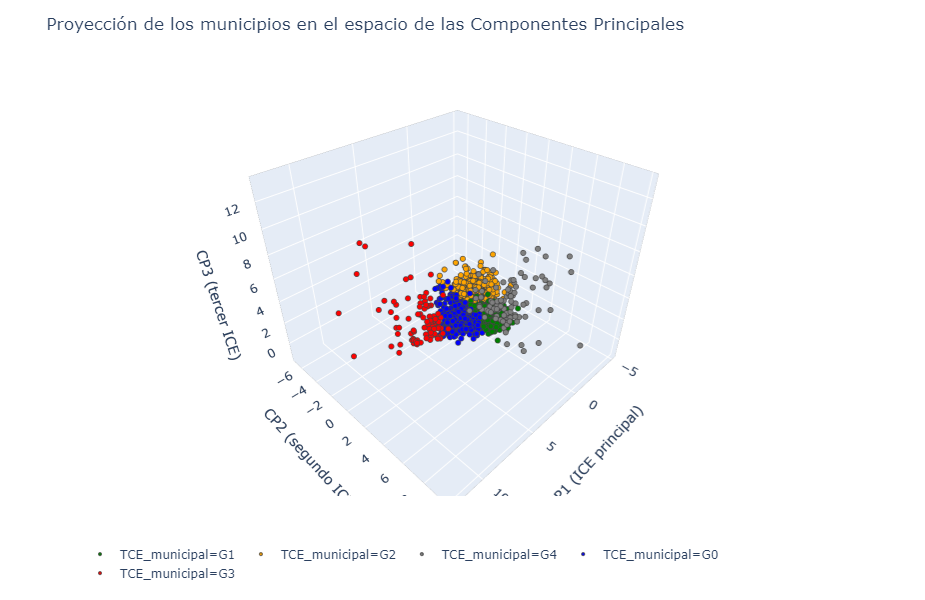

In [61]:
eti=['NOMBRE_ESTADO','NUM_SECC_RUR', 'LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE', 'Autocorr_LNE', 'CP1 (ICE principal)', 'CP2 (segundo ICE)', 'CP3 (tercer ICE)', 'TCE_municipal', 'Atipicidad']
#3-d scatter plot con plotly
fig = px.scatter_3d(resultados_final, 
                    x='CP1 (ICE principal)', 
                    y='CP2 (segundo ICE)', 
                    z='CP3 (tercer ICE)',
              color='TCE_municipal',
                    color_discrete_map={
                'G0':'blue',
                  'G1':'green',
                  'G2': 'orange',
                  'G3': 'red',
                  'G4': 'grey'},
                    hover_name='NOMBRE_MUNICIPIO',
                   hover_data = eti)
fig.update_traces(mode='markers', marker_line_width=1, marker_size=3)
fig.update_layout(scene = dict(
                    xaxis_title='CP1 (ICE principal)',
                    yaxis_title='CP2 (segundo ICE)',
                    zaxis_title='CP3 (tercer ICE)'),
                  title="Proyección de los municipios en el espacio de las Componentes Principales",
                 legend_orientation="h")
fig.show()
#salvar animación en html
fig.write_html("C:/Users/miguel.alvarez/Google Drive/INFOTEC/Proyecto/Code-Data/Mun/Pyplotly_Proyeccion3d_Mun.html")

<br>

## Referencias
- https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/
- https://plot.ly/python/v3/ipython-notebooks/principal-component-analysis/#pca-vs-lda
- https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python
- https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b
- https://alexanderfabisch.github.io/t-sne-in-scikit-learn.html
- https://medium.com/@indreshbhattacharyya/feature-selection-categorical-feature-selection-boruta-light-gbm-chi-square-bf47e94e2558
- https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
- https://stackoverflow.com/questions/52472757/creating-a-boxplot-facetgrid-in-seaborn-for-python
- https://www.kdnuggets.com/2019/07/10-simple-hacks-speed-data-analysis-python.html
- https://github.com/adam-p/markdown-here/wiki/Markdown-Here-Cheatsheet